# Investigating particle swarm optimisation in solving the Travelling Salesman Problem

## Abstract

Particle Swarm Optimisation (PSO) is a computational technique used to optimise a problem by iteratively improving the particles based on eachother, taking inspiration from nature, such as from birds in flight. PSO has many applications, from robotics to networks.

The Travelling Salesman Problem is a famous combinatorial optimisation problem which asks for the shortest route by which a salesman can visit a set of locations and return home. It is NP-hard, meaning that there is no efficient algorithm that can solve it in polynomial time. Hence, approximation methods such as PSO are necessary.

In this notebook I investigate using PSO in solving instances of the Travelling Salesman Problem, taken from the TSPLIB dataset. A variety of instances, from small (burma14) to medium (att48) to large (lin105) were used in testing it.

I developed 2 variants of the optimiser, based on 2 approaches taken from 2 different papers:
<li>The first approach utilising velocity based swaps and greedy initialisation, the idea taken from [1] </li>
<li>A second approach using segment reinsertion inspired by genetic mutations, inspired by [2]</li>

The results show that segment reinsertion is significantly better in performance than the other approach taken, and consistently provides optimal solutions, on par with and if not better than the results found in [2].

## Learning Objectives

<li>Explore the effectiveness of different particle swarm optimisation variants in solving instances of the Travelling Salesman Problem.</li>
<li>Investigate how tuning the parameters and balancing exploration with exploitation can impact the results.</li>
<li>Test the algorithms on a variety of problem instances, analysing their performance and results.</li>
<li>Compare the results with the original implementations discussed in the papers.</li>

## Contents

1. [Modules](#Modules)  
   1.1. [TSPLIB Dataset Overview](##TSPLIB-Dataset-Overview)  
      1.1.1. [Parsing](###Parsing)  
      1.1.2. [burma14](###burma14)  
      1.1.3. [att48](###att48)  
      1.1.4. [lin105](###lin105)  
   1.2. [PSO Implementations](##PSO-Implementations)  
      1.2.1. [PSO Variant 1 (velocity based swap mutations)](###PSO-Variant-1-(velocity-based-swap-mutations))  
      1.2.2. [PSO Variant 2 (genetic inspired segment reinsertion)](###PSO-Variant-2-(genetic-inspired-segment-reinsertion))
2. [Analysis](#Analysis)  

   2.1. [burma14 analysis](##burma14-Analysis)  
      2.1.1. [Initial Comparison](###Initial-Comparison-1)  
         2.1.1.1. [V1](#v1)  
         2.1.1.2. [V2](####V2-1)  
         2.1.1.3. [Comparing Results](####Comparing-Results-1)    
      2.1.2. [Comparison after tuning parameters](###Comparison-After-Tuning-Parameters-1)  
         2.1.2.1. [V1](####V1-2)  
         2.1.2.2. [V2](####V2-2)  
         2.1.2.3. [Comparing Results](####Comparing-Results-2)  
         
   2.2. [att48 analysis](#att48-analysis)  
      2.2.1. [Initial Comparison](#initial-comparison-2)   
         2.2.1.1. [V1](#v1-3)  
         2.2.1.2. [V2](#v2-3)  
         2.2.1.3. [Comparing Results](#Comparing-Results-3)  
      2.2.2. [Comparison after tuning parameters](#comparison-after-tuning-parameters-2)  
         2.2.2.1. [V1](#v1-4)  
         2.2.2.2. [V2](#v2-4)  
         2.2.2.3. [Comparing Results](#Comparing-Results-4)  
         
   2.3. [lin105 analysis](#lin105-analysis)  
      2.3.1. [Comparison](#comparison)  
         2.3.1.1. [V1](#v1-5)  
         2.3.1.2. [V2](#v2-5)  
         2.3.1.3. [Comparing Results](#Comparing-Results-5)  
         <br>
         
3. [Comparison with other approaches](#Comparison-with-other-approaches)  
   3.1. [A brief comparison of burma14](#A-brief-comparison-of-burma14)  
   3.2. [A brief comparison of bays29](#A-brief-comparison-of-bays29)  
4. [Conclusion and Future Work](#Conclusion-and-Future-Work)  
5. [References](#References)  


## Modules

I used Pytorch for the efficient tensor operations and easy manipulation of data, Matplotlib for visualising the results, and the Requests library to get the data from the source.  
I also used pandas to create dataframes, which is useful for getting data for tables. I used the time library for monitoring how fast each algorithm was.

In [106]:
import requests
import matplotlib.pyplot as plt
import torch
import pandas as pd
import time

## TSPLIB Dataset Overview

### Parsing

TSPLIB [3] is an online dataset consisting of instances of the Travelling Salesman Problem.. Each problem is contained in a .tsp file, with data contained in a format similar to YAML, but it needs a custom parser, which I created below. The most important section is the NODE_COORD_SECTION, which contains the coordinates of the nodes/cities to be visited.

In [183]:
response = requests.get("https://raw.githubusercontent.com/mastqe/tsplib/refs/heads/master/burma14.tsp")
print(response.text)

NAME: burma14
TYPE: TSP
COMMENT: 14-Staedte in Burma (Zaw Win)
DIMENSION: 14
EDGE_WEIGHT_TYPE: GEO
EDGE_WEIGHT_FORMAT: FUNCTION 
DISPLAY_DATA_TYPE: COORD_DISPLAY
NODE_COORD_SECTION
   1  16.47       96.10
   2  16.47       94.44
   3  20.09       92.54
   4  22.39       93.37
   5  25.23       97.24
   6  22.00       96.05
   7  20.47       97.02
   8  17.20       96.29
   9  16.30       97.38
  10  14.05       98.12
  11  16.53       97.38
  12  21.52       95.59
  13  19.41       97.13
  14  20.09       94.55
EOF






When parsing the file, I created several data structures that will be necessary for the optimisation process.  
<b>nodeCoordinates</b>: This is a dictionary mapping node ID to the coordinates.  
<b>coordinatesTensor</b>: This is the tensor version of the dictionary, used in the PSO algorithm.  
<b>distanceMatrix</b>: This is a construction of the edge weights, calculated using the euclidean distance between nodes.

In [185]:
class TspParser:
    name: str
    dimension: int
    nodeCoordinates: dict
    coordinatesTensor: list
    distanceMatrix: None

    #Parsing the file in the constructor
    def __init__(self, fileContent):
        self.nodeCoordinates = {}
        unprocessedData = fileContent.split("\n")
        isCoordinateSection = False
        for line in unprocessedData:
            line = line.strip()

            if "EOF" in line:
                break
            if "NAME" in line:
                nameData = line.split(":")
                self.name = nameData[1]
            if "DIMENSION" in line:
                dimensionData = line.split(":")
                self.dimension = int(dimensionData[1])
                
            if isCoordinateSection:
                line = line.strip()
                stringData = line.split()
                nodeId = int(stringData[0])
                x = float(stringData[1])
                y = float(stringData[2])
                self.nodeCoordinates[nodeId] = (x, y)
                
            if "NODE_COORD_SECTION" in line or "DISPLAY_DATA_SECTION" in line:
                isCoordinateSection = True

        self.coordinatesTensor = torch.tensor(list(self.nodeCoordinates.values()), dtype=torch.float32)
        self.computeDistanceMatrix()

    #separate function to compute the edge weights and put into a matrix
    def computeDistanceMatrix(self):
        nodeCount = self.coordinatesTensor.shape[0]
        distanceMatrix = torch.zeros((nodeCount + 1, nodeCount + 1))
        for i in range(1, nodeCount + 1):
            for j in range(1, nodeCount + 1):
                if i != j:
                    distanceMatrix[i, j] = torch.norm(self.coordinatesTensor[i - 1] - self.coordinatesTensor[j - 1])
        self.distanceMatrix = distanceMatrix
    
    #helper function to visualise the problem
    def plotCoords(self, plotEdges=True, path=None):
        nodeIds = list(self.nodeCoordinates.keys())
        xCoords = [coord[0] for coord in self.nodeCoordinates.values()]
        yCoords = [coord[1] for coord in self.nodeCoordinates.values()]
        plt.figure(figsize=(20, 20))
        plt.scatter(xCoords, yCoords, c='blue', marker='o', label='Nodes')
        
        for i, nodeId in enumerate(nodeIds):
            plt.text(xCoords[i], yCoords[i], str(nodeId), fontsize=12, ha='right', color='black')

        if path:
            xValues = []
            yValues = []

            for i in path:
                coords = self.nodeCoordinates[i]
                xValues.append(coords[0])
                yValues.append(coords[1])

            for i in range(len(xValues) - 1):
                plt.plot(xValues[i:i+2], yValues[i:i+2], 'ro-', markersize=5, label='Best Path' if i == 0 else "")
            
        if plotEdges:
            nodeCount = len(self.nodeCoordinates)
            for i in range(1, nodeCount + 1): 
                for j in range(i + 1, nodeCount + 1):
                    if self.distanceMatrix[i, j] > 0:
                        x1, y1 = self.nodeCoordinates[i]
                        x2, y2 = self.nodeCoordinates[j]
                        plt.plot([x1, x2], [y1, y2], 'k-', lw=0.5, alpha=0.1)
        plt.plot([xValues[-1], xValues[0]], [yValues[-1], yValues[0]], 'ro-', markersize=5)
        plt.xlabel('X Coordinates')
        plt.ylabel('Y Coordinates')
        plt.title('Node coordinates')
        plt.show()

### burma14

I will be using a variety of files from this dataset to represent a good range. The simplest one is burma14, with only 14 nodes.

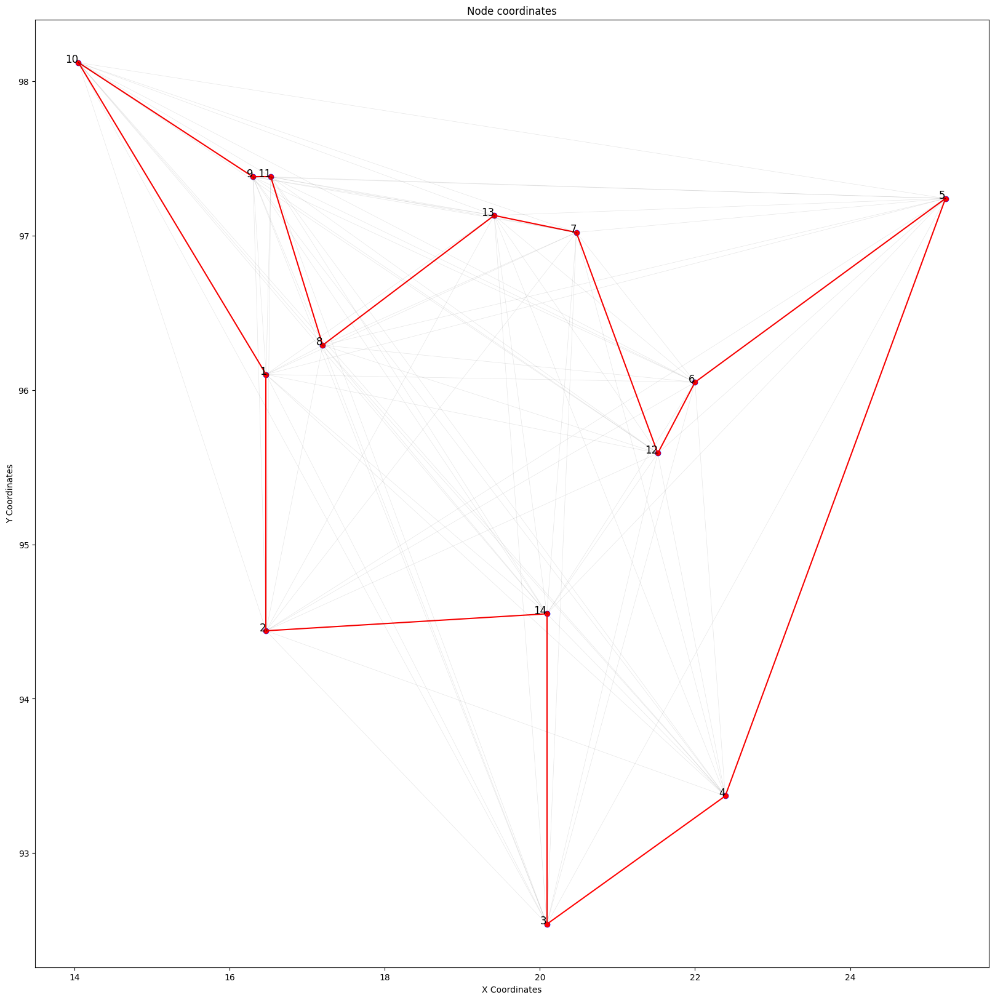

In [186]:
burma14 = TspParser(response.text)
path = [3, 14, 2, 1, 10, 9, 11, 8, 13, 7, 12, 6, 5, 4]
burma14.plotCoords(path=path)

### att48

The att48 problem is a lot more complex, covering all 48 capitals of mainland USA. there is a wide distribution of nodes, with many being close together and others being separated significantly. This means that it is the perfect test for the PSO algorithms. It is large enough to pose a challenge for the algorithm, but small enough to be solved in a reasonable amount of time on my hardware.

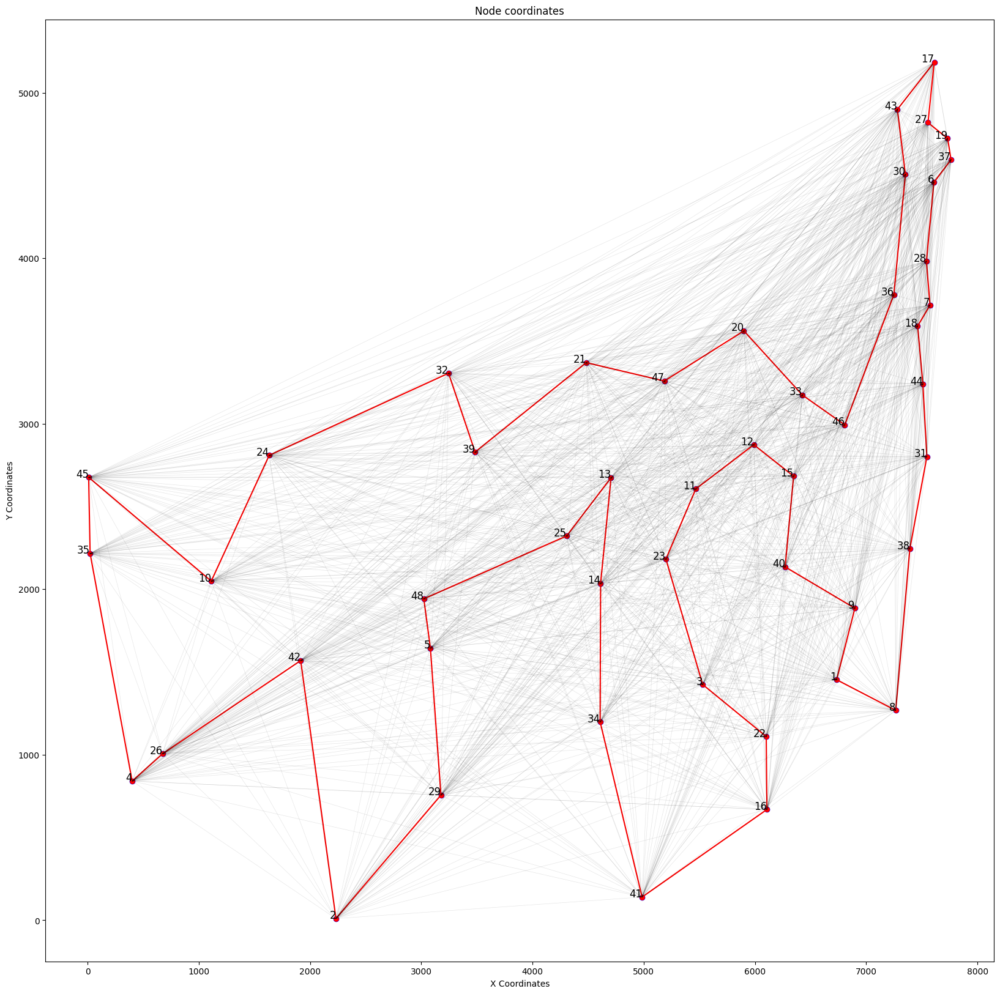

In [187]:
response = requests.get("https://raw.githubusercontent.com/mastqe/tsplib/refs/heads/master/att48.tsp")
att48 = TspParser(response.text)
path = [27, 19, 37, 6, 28, 7, 18, 44, 31, 38, 8, 1, 9, 40, 15, 12, 11, 23, 3, 22, 16, 41, 34, 14, 13, 25, 48, 5, 29, 2, 42, 26, 4, 35, 45, 10, 24, 32, 39, 21, 47, 20, 33, 46, 36, 30, 43, 17]
att48.plotCoords(path=path)

### lin105

lin105 is a significantly larger problem than the others, and is a stretch goal for this project. Hardware and time constraints mean that the algorithms I have cannot solve these without thousands of iterations, which would potentially take hours, so I do not expect my algorithms to come to the optimal solution for this in a reasonable amount of time. The inclusion of this problem is more for comparitive analysis.

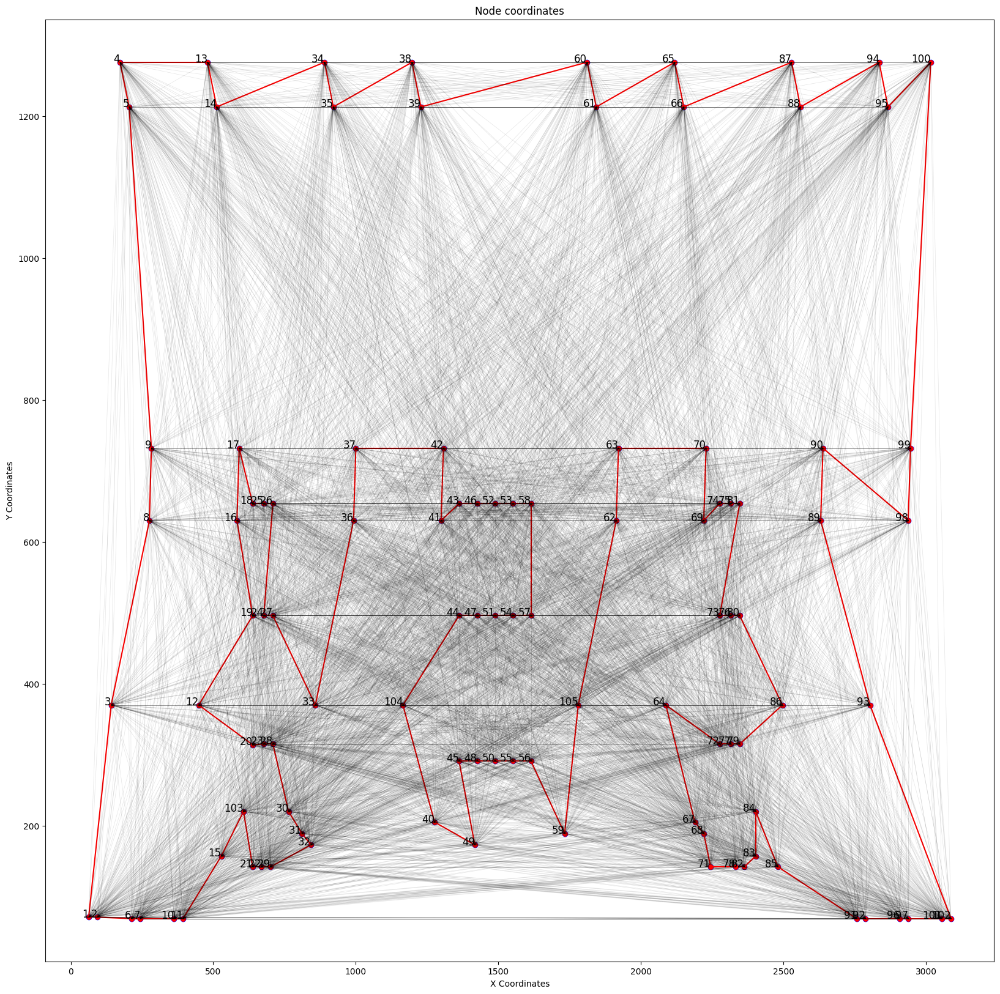

In [189]:
response = requests.get("https://raw.githubusercontent.com/mastqe/tsplib/refs/heads/master/lin105.tsp")
lin105 = TspParser(response.text)
path = [71, 68, 67, 64, 72, 77, 79, 86, 80, 76, 73, 81, 75, 74, 69, 70, 63, 62, 105, 59, 56, 55, 50, 48, 45, 49, 40, 104, 44, 47, 51, 54, 57, 58, 53, 52, 46, 43, 41, 42, 37, 36, 33, 27, 24, 26, 25, 18, 17, 16, 19, 12, 20, 23, 28, 30, 31, 32, 29, 22, 21, 103, 15, 11, 10, 7, 6, 2, 1, 3, 8, 9, 5, 4, 13, 14, 34, 35, 38, 39, 60, 61, 65, 66, 87, 88, 94, 95, 100, 99, 98, 90, 89, 93, 102, 101, 97, 96, 92, 91, 85, 84, 83, 82, 78]
lin105.plotCoords(path=path)

## PSO Implementations

### PSO Variant 1 (velocity based swap mutations)

Typically, in the PSO algorithm, there is a velocity component which updates the direction of the particle based on its current position, the local best position, and the global best position. However, for solving the Travelling Salesman Problem we cannot simply update a discrete value.

The approach I took for this problem is shown in this paper. Instead of a typical velocity, I use swap mutations. This involves a sequence of swap operations, represented as an array of arrays of length 2. Each pair indicates 2 indices that will have their values swapped.

In the image below, a swap operation is applied to a list, indicating that item at position 1 is swapped with the item at position 2.  
In the second line, a sequence of swaps is applied. This is the approach that will be taken with this variant of the PSO algorithm.

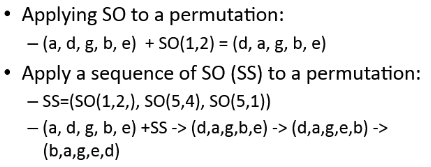[4]

In this approach, the sequence of swaps is kept track of, in the velocity attribute of the particle. It is initialised as a random array of pairs, and updated based on the local best velocity and the global best velocity. There is also a randomisation element to it so that they do not converge on local optima too much. 

Also, instead of initialising the particle's route randomly, it can be done in a greedy way, with an algorithm that quickly takes the shortest possible nodes based on the distance matrix. It obviously does not provide optimal solutions straight away, but they speed up the overall convergence time and result in less iterations needed.

Regarding the parameters, there are several to consider:  
<li>swapCount: the amount of swap operations. In the image above, there are 3 operations, which I made the default option, but this can be changed.</li>
<li>alpha, beta, gamma: these 3 parameters dictate the proportions of how the swap operations are generated. They are generated with respect to the local best, global best, and random.  
In typical implementations, these might also be referred to as inertia, particle cognition, and social influence.</li>

In [130]:
class ParticleV1:
   
    def __init__(self, nodeCount, swapCount=3, greedy=True):
        self.swapCount = swapCount
        self.nodeCount = nodeCount
        if greedy:
            self.greedyInitialisation()
        else:
            self.position = torch.randperm(nodeCount) + 1
        self.fitnessValue = float("inf")
        self.localBestFitnessPosition = self.position.clone() 
        self.localBestFitnessValue = float("inf")
        self.velocity = [torch.randint(0, nodeCount, (2,)) for _ in range(swapCount)]
        self.localBestVelocity = self.velocity
    
    #gets the distance matrix as a static variable
    @staticmethod
    def updateDistanceMatrix(matrix):
        ParticleV1.distanceMatrix = matrix
            
    #calculate length of current route. Goes through every element in position, and uses distance matrix to get edge length
    def calculateRouteLength(self, position):
        tour = position.tolist() 
        totalDistance = sum(ParticleV1.distanceMatrix[tour[i], tour[i+1]] for i in range(len(tour)-1))
        totalDistance += ParticleV1.distanceMatrix[tour[-1], tour[0]]
        return totalDistance
    
    #initialises the particle positions in a greedy way
    def greedyInitialisation(self, k=5):
        nodeCount = ParticleV1.distanceMatrix.shape[0] - 1 
        startNode = torch.randint(1, nodeCount + 1, (1,)).item()
        route = [startNode] 
        unvisited = set(range(1, nodeCount + 1)) - {startNode} 

        currentNode = startNode
        while unvisited:
            distances = ParticleV1.distanceMatrix[currentNode, 1:]  
            nearestNeighbors = sorted([(distances[i], i + 1) for i in range(nodeCount) if (i + 1) in unvisited])[:k]
            nextNode = nearestNeighbors[torch.randint(0, len(nearestNeighbors), (1,)).item()][1]    
            route.append(nextNode)
            unvisited.remove(nextNode)
            currentNode = nextNode

        self.position = torch.tensor(route) 

    #updates velocity (swap sequence) according to the given proportions
    def updateVelocity(self, globalBestVelocity, alpha=1, beta=1, gamma=1):
        maxAttempts = 10
        newVelocity = []

        #calculate what proportions of the new velocity should be generated by the 3 parameters.
        #By default, if swapCount=3, then
        #1 swap will be random, 1 swap will be from the local best, and 1 swap will be from the global best.
        total = alpha + beta + gamma
        alphaCount = round((alpha / total) * self.swapCount)
        betaCount = round((beta / total) * self.swapCount)
        gammaCount = self.swapCount - (alphaCount + betaCount)

        def addSwaps(velocitySource, count_max):
            count = 0
            attempts = 0
            while count < count_max and attempts < maxAttempts:
                swapOperation = velocitySource[torch.randint(0, len(velocitySource), (1,)).item()]
                i, j = swapOperation.tolist()
                newPosition = self.position.clone()
                newPosition[i], newPosition[j] = newPosition[j].clone(), newPosition[i].clone()

                if self.calculateRouteLength(newPosition) < self.calculateRouteLength(self.position):
                    newVelocity.append(swapOperation)
                    count += 1
                attempts += 1
            
            #if attempts get exhausted, then simply add random swaps until filled
            while count < count_max:
                swapOperation = velocitySource[torch.randint(0, len(velocitySource), (1,)).item()]
                newVelocity.append(swapOperation)
                count += 1

        #add the swaps based on beta and gamma
        if betaCount > 0 and len(self.localBestVelocity) > 0:
            addSwaps(self.localBestVelocity, betaCount)
        if gammaCount > 0 and len(globalBestVelocity) > 0:
            addSwaps(globalBestVelocity, gammaCount)
            
        # Add random swaps to fill remaining slots (adding swaps based on alpha parameter)
        attempts = 0
        while len(newVelocity) < self.swapCount and attempts < maxAttempts:
            swapOperation = torch.randint(0, self.nodeCount, (2,))
            i, j = swapOperation.tolist()
            newPosition = self.position.clone()
            newPosition[i], newPosition[j] = newPosition[j].clone(), newPosition[i].clone()

            if self.calculateRouteLength(newPosition) < self.calculateRouteLength(self.position):
                newVelocity.append(swapOperation)
            attempts += 1
        self.velocity = newVelocity
        
    def swapMutation(self):  
        for [i, j] in self.velocity:
            self.position[i], self.position[j] = self.position[j].clone(), self.position[i].clone()

            

In [123]:
class ParticleSwarmOptimiserV1:
    history : dict
    timeTaken: float
        
    def __init__(self, nodeCount, nodeCoordinates, distanceMatrix, particleCount, swapCount, alpha=1, beta=1, gamma=1, greedyInitialisation=True):
        self.nodeCount = nodeCount
        self.nodeCoordinates = nodeCoordinates
        self.distanceMatrix = distanceMatrix
        ParticleV1.updateDistanceMatrix(distanceMatrix)
        self.particleSwarm = [ParticleV1(nodeCount, swapCount=swapCount, greedy=greedyInitialisation) for _ in range(particleCount)]
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma
        self.globalBestFitnessPosition = self.particleSwarm[0].position.clone()
        self.globalBestFitnessValue = float("inf")
        self.particleCount = particleCount
        self.globalBestVelocity = self.particleSwarm[0].velocity
    
    def getBestSolution(self):
        return self.globalBestFitnessPosition, self.globalBestFitnessValue, self.history, self.timeTaken

    def optimise(self, maxIterations):
        self.timeTaken = 0
        start = time.time()
        self.history = {}
        for iteration in range(maxIterations):
            #print(iteration)

            #iterates over each particle, updating local and global fitness values and routes as needed
            for particle in self.particleSwarm:
                fitness = particle.calculateRouteLength(particle.position)
                particle.fitnessValue = fitness
                if fitness < particle.localBestFitnessValue:
                    particle.localBestFitnessValue = fitness
                    particle.localBestFitnessPosition = particle.position.clone()
                    particle.localBestVelocity = particle.velocity

                if fitness < self.globalBestFitnessValue:
                    self.globalBestFitnessValue = fitness
                    self.globalBestFitnessPosition = particle.position.clone()
                    self.globalBestVelocity = particle.localBestVelocity

            for particle in self.particleSwarm:
                particle.swapMutation()
                particle.updateVelocity(self.globalBestVelocity, self.alpha, self.beta, self.gamma)

            self.history[iteration] = (self.globalBestFitnessPosition, self.globalBestFitnessValue)
        end = time.time()
        self.timeTaken = end - start
    
    #the below methods are just for analysis and visualisation purposes  
    def visualise(self, ax=None):
        plt.figure(figsize=(10, 6))
        if ax is None:        
            ax = plt.gca()
        xCoords = [coord[0] for coord in self.nodeCoordinates.values()]
        yCoords = [coord[1] for coord in self.nodeCoordinates.values()]
        plt.scatter(xCoords, yCoords, c='blue', marker='o', label='Nodes')
        nodeCount = len(self.nodeCoordinates)
        for i in range(1, nodeCount + 1):
            for j in range(i + 1, nodeCount + 1): 
                if self.distanceMatrix[i, j] > 0:
                    x1, y1 = self.nodeCoordinates[i ]
                    x2, y2 = self.nodeCoordinates[j]
                    plt.plot([x1, x2], [y1, y2], 'k-', lw=0.5, alpha=0.1)

        xValues = []
        yValues = []
        bestPath = self.globalBestFitnessPosition.tolist()

        for i in bestPath:
            coords = self.nodeCoordinates[i]
            xValues.append(coords[0])
            yValues.append(coords[1])

        for i in range(len(xValues) - 1):
            plt.plot(xValues[i:i+2], yValues[i:i+2], 'ro-', markersize=5, label='Best Path' if i == 0 else "")
        plt.plot([xValues[-1], xValues[0]], [yValues[-1], yValues[0]], 'ro-', markersize=5)
        plt.xlabel('X Coordinates')
        plt.ylabel('Y Coordinates')
        plt.title('Node Coordinates')
        plt.legend()
        plt.show() 
        
    def showIterationHistory(self, ax=None):
        table_data = []
        for iteration, (position, value) in self.history.items():
            if iteration % 10 == 0 or iteration == len(self.history)-1:
                position_list = position.tolist() 
                value = value.item()
                table_data.append([iteration, position_list, value])
        df = pd.DataFrame(table_data, columns=["Iteration", "Position", "Value"])
        
        if ax is None:
            fig, ax = plt.subplots(figsize=(15, 6))
        ax.axis('off')
        table = ax.table(cellText=df.values, loc='center', colWidths=[0.1, 0.7, 0.1], cellLoc='center', colColours=["lightgrey"]*df.shape[1])

        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1.5, 1.5) 
        plt.show()
        
    def showLossAgainstIterationGraph(self):
        iterations = []
        values = []
        for iteration, (position, value) in self.history.items():
            values.append(value.item())
            iterations.append(iteration)

        plt.figure(figsize=(10, 6))
        plt.plot(iterations, values, marker='o', color='b', label='Fitness Value')
        plt.xlabel('Iteration')
        plt.ylabel('Value')
        plt.title('Iteration vs Value')
        plt.grid(True)
        plt.legend()
        plt.show()
        

## PSO variant 2 (genetic inspired segment reinsertion)

The third variant is inspired by [2]. This paper goes through the use of genetic crossover operations on the particle paths. Instead of directly implementing crossover mutations, I implemented a segment reinsertion method that takes entire segments from the current, local best, and global best, and strategically combines these into a brand new path.

Example:  
Given that we have Current Path: [A, B, C, D, E]  
and Global Best: [E, B, D, C, A]  

The algorithm will extract a random segment from global best, such as [D, C, A], and insert this into the current path, which will create a new, potentially improved path:  
[B, D, C, A, E] 

This maintains good structures from better solutions and inserts them into our current path.  
In practice, I implemented segment insertions from the local best, global best, and randomly, where the importance of each of these can be controlled with hyperparameters alpha, beta, gamma.

In [114]:
class ParticleV2:
   
    def __init__(self, nodeCount, swapCount=3, greedy=True):
        self.swapCount = swapCount
        self.nodeCount = nodeCount
        if greedy:
            self.greedyInitialisation()
        else:
            self.position = torch.randperm(nodeCount) + 1
        self.fitnessValue = float("inf")
        self.localBestFitnessPosition = self.position.clone() 
        self.localBestFitnessValue = float("inf")
    
    @staticmethod
    def updateDistanceMatrix(matrix):
        ParticleV2.distanceMatrix = matrix
            
    #calculate length of current route. Goes through every element in position, and uses distance matrix to get edge length
    def calculateRouteLength(self, position):
        tour = position.tolist() 
        totalDistance = sum(ParticleV2.distanceMatrix[tour[i], tour[i+1]] for i in range(len(tour)-1))
        totalDistance += ParticleV2.distanceMatrix[tour[-1], tour[0]]
        return totalDistance
    
    #initialises the particle positions in a greedy way
    def greedyInitialisation(self, k=5):
        nodeCount = ParticleV2.distanceMatrix.shape[0] - 1 
        startNode = torch.randint(1, nodeCount + 1, (1,)).item()
        route = [startNode] 
        unvisited = set(range(1, nodeCount + 1)) - {startNode} 

        currentNode = startNode
        while unvisited:
            distances = ParticleV2.distanceMatrix[currentNode, 1:]  
            nearestNeighbors = sorted([(distances[i], i + 1) for i in range(nodeCount) if (i + 1) in unvisited])[:k]
            nextNode = nearestNeighbors[torch.randint(0, len(nearestNeighbors), (1,)).item()][1]    
            route.append(nextNode)
            unvisited.remove(nextNode)
            currentNode = nextNode

        self.position = torch.tensor(route) 

    #similarly to V1, calculate what proportions should be generated by the 3 parameters.
    def swapMutation(self, globalBestPath, alpha=1, beta=1, gamma=1):  
        newPosition = self.position.tolist() 
        innerCount = 0
        foundBetter = False

        total = alpha + beta + gamma
        alphaCount = round((alpha / total) * self.swapCount)
        betaCount = round((beta / total) * self.swapCount)
        gammaCount = self.swapCount - (alphaCount + betaCount)

        def extractAndInsertSegment(sourcePath):
            segmentLength = torch.randint(1, max(2, self.nodeCount // 4), (1,)).item()
            startIdx = torch.randint(0, self.nodeCount - segmentLength, (1,)).item()
            segment = sourcePath[startIdx:startIdx + segmentLength]
            tempPosition = [node for node in newPosition if node not in segment]
            insertIdx = torch.randint(0, len(tempPosition) + 1, (1,)).item()
            tempPosition[insertIdx:insertIdx] = segment
        
            return tempPosition

        #repeatedly do segment reinsertion according to the proportions given
        while not foundBetter and innerCount < 10:
            candidates = []
            for _ in range(alphaCount):
                candidates.append(extractAndInsertSegment(self.position))
            for _ in range(betaCount):
                candidates.append(extractAndInsertSegment(self.localBestFitnessPosition))
            for _ in range(gammaCount):
                candidates.append(extractAndInsertSegment(globalBestPath))

            bestCandidate = min(
                (torch.tensor(c, dtype=torch.long) for c in candidates),
                key=lambda pos: self.calculateRouteLength(pos)
            )

            if self.calculateRouteLength(bestCandidate) < self.calculateRouteLength(self.position):
                self.position = bestCandidate.clone()
                foundBetter = True
            innerCount += 1


In [124]:
class ParticleSwarmOptimiserV2:
    history : dict
    timeTaken: float
        
    def __init__(self, nodeCount, nodeCoordinates, distanceMatrix, particleCount, swapCount, alpha=1, beta=1, gamma=1, greedyInitialisation=True):
        self.nodeCount = nodeCount
        self.nodeCoordinates = nodeCoordinates
        self.distanceMatrix = distanceMatrix
        ParticleV2.updateDistanceMatrix(distanceMatrix)
        self.particleSwarm = [ParticleV2(nodeCount, swapCount=swapCount, greedy=greedyInitialisation) for _ in range(particleCount)]
        self.beta = beta
        self.alpha = alpha
        self.gamma = gamma
        self.globalBestFitnessPosition = self.particleSwarm[0].position.clone()
        self.globalBestFitnessValue = float("inf")
        self.particleCount = particleCount
    
    def getBestSolution(self):
        return self.globalBestFitnessPosition, self.globalBestFitnessValue, self.history, self.timeTaken

    def optimise(self, maxIterations):
        self.timeTaken = 0
        start = time.time()
        self.history = {}

        #again, iterate over each particle and update the local and global bests accordingly
        for iteration in range(maxIterations):
            #print(iteration)
            for particle in self.particleSwarm:
                fitness = particle.calculateRouteLength(particle.position)
                particle.fitnessValue = fitness
                if fitness < particle.localBestFitnessValue:
                    particle.localBestFitnessValue = fitness
                    particle.localBestFitnessPosition = particle.position.clone()

                if fitness < self.globalBestFitnessValue:
                    self.globalBestFitnessValue = fitness
                    self.globalBestFitnessPosition = particle.position.clone()

            for particle in self.particleSwarm:
                particle.swapMutation(self.globalBestFitnessPosition, self.alpha, self.beta, self.gamma)

            self.history[iteration] = (self.globalBestFitnessPosition, self.globalBestFitnessValue)
        end = time.time()
        self.timeTaken = end - start
        
    #methods for analysis and visualisation
    def visualise(self, ax=None):
        plt.figure(figsize=(10, 6))
        if ax is None:        
            ax = plt.gca()
        xCoords = [coord[0] for coord in self.nodeCoordinates.values()]
        yCoords = [coord[1] for coord in self.nodeCoordinates.values()]
        plt.scatter(xCoords, yCoords, c='blue', marker='o', label='Nodes')
        nodeCount = len(self.nodeCoordinates)
        for i in range(1, nodeCount + 1):
            for j in range(i + 1, nodeCount + 1): 
                if self.distanceMatrix[i, j] > 0:
                    x1, y1 = self.nodeCoordinates[i ]
                    x2, y2 = self.nodeCoordinates[j]
                    plt.plot([x1, x2], [y1, y2], 'k-', lw=0.5, alpha=0.1)

        xValues = []
        yValues = []
        bestPath = self.globalBestFitnessPosition.tolist()

        for i in bestPath:
            coords = self.nodeCoordinates[i]
            xValues.append(coords[0])
            yValues.append(coords[1])

        for i in range(len(xValues) - 1):
            plt.plot(xValues[i:i+2], yValues[i:i+2], 'ro-', markersize=5, label='Best Path' if i == 0 else "")
        plt.plot([xValues[-1], xValues[0]], [yValues[-1], yValues[0]], 'ro-', markersize=5)
        plt.xlabel('X Coordinates')
        plt.ylabel('Y Coordinates')
        plt.title('Node Coordinates')
        plt.legend()
        plt.show() 
        
    def showIterationHistory(self, ax=None):
        table_data = []
        for iteration, (position, value) in self.history.items():
            if iteration % 10 == 0 or iteration == len(self.history)-1:
                position_list = position.tolist() 
                value = value.item()
                table_data.append([iteration, position_list, value])
        df = pd.DataFrame(table_data, columns=["Iteration", "Position", "Value"])
        
        if ax is None:
            fig, ax = plt.subplots(figsize=(15, 6))
        ax.axis('off')
        table = ax.table(cellText=df.values, loc='center', colWidths=[0.1, 0.7, 0.1], cellLoc='center', colColours=["lightgrey"]*df.shape[1])

        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1.5, 1.5) 
        plt.show()
        
    def showLossAgainstIterationGraph(self):
        iterations = []
        values = []
        for iteration, (position, value) in self.history.items():
            values.append(value.item())
            iterations.append(iteration)

        plt.figure(figsize=(10, 6))
        plt.plot(iterations, values, marker='o', color='b', label='Fitness Value')
        plt.xlabel('Iteration')
        plt.ylabel('Value')
        plt.title('Iteration vs Value')
        plt.grid(True)
        plt.legend()
        plt.show()


## Analysis

For the analysis, I made a some functions to draw the solutions and graphs of losses over time, so that the metrics of each variant can be compared, as well as the solutions that they generate.

In [149]:
#function to plot best paths found from both variants
def compareBestRoutes(psoV1, psoV2):
    plt.figure(figsize=(10, 6))
    ax = plt.gca()

    xCoords = [coord[0] for coord in psoV1.nodeCoordinates.values()]
    yCoords = [coord[1] for coord in psoV1.nodeCoordinates.values()]
    ax.scatter(xCoords, yCoords, c='blue', marker='o', label='Nodes')

    def plotBestPath(pso, color, linestyle, offset, label):
        bestPath = pso.globalBestFitnessPosition.tolist()

        xValues = [pso.nodeCoordinates[i][0] + offset for i in bestPath]
        yValues = [pso.nodeCoordinates[i][1] + offset for i in bestPath]

        ax.plot(xValues, yValues, linestyle, color=color, markersize=5, alpha=0.8, label=label)
        ax.plot([xValues[-1], xValues[0]], [yValues[-1], yValues[0]], linestyle, color=color, markersize=5, alpha=0.8)
    plotBestPath(psoV1, 'r', 'o-', 0.01, 'Best Path (Variant 1)')
    plotBestPath(psoV2, 'g', 'o--', -0.01, 'Best Path (Variant 2)') 

    ax.set_xlabel('X Coordinates')
    ax.set_ylabel('Y Coordinates')
    ax.set_title('Comparison of Best Paths')
    ax.legend()
    plt.show()

#function to plot both curves of loss against iterations
def compareLossCurves(psoV1, psoV2):
    plt.figure(figsize=(10, 6))

    def extractLossData(pso):
        iterations = []
        values = []
        for iteration, (_, value) in pso.history.items():
            iterations.append(iteration)
            values.append(value.item())
        return iterations, values

    iterations1, values1 = extractLossData(psoV1)
    iterations2, values2 = extractLossData(psoV2)
    plt.plot(iterations1, values1, marker='o', linestyle='-', color='r', label='Variant 1')
    plt.plot(iterations2, values2, marker='s', linestyle='--', color='g', label='Variant 2')

    plt.xlabel('Iteration')
    plt.ylabel('Fitness Value')
    plt.title('Comparison of Fitness Value over Iterations')
    plt.grid(True)
    plt.legend()
    plt.show()

    
def comparisonTable(psoV1, psoV2):

    # Create table
    iterationsV1, iterationsV2 = len(psoV1.history), len(psoV2.history)  
    particlesV1, particlesV2 = len(psoV1.particleSwarm), len(psoV2.particleSwarm)
    betaV1, betaV2 = psoV1.beta, psoV2.beta
    alphaV1, alphaV2 = psoV1.alpha, psoV2.alpha
    gammaV1, gammaV2 = psoV1.gamma, psoV2.gamma
    data = {
        "Metric": ["Execution Time (s)", "Cost", "Iterations", "Particles", "alpha|beta|gamma"],
        "V1":[f"{psoV1.timeTaken}", f"{psoV1.globalBestFitnessValue:.2f}", iterationsV1, particlesV1, f"{alphaV1}|{betaV1}|{gammaV1}"],
        "V2":[f"{psoV2.timeTaken}", f"{psoV2.globalBestFitnessValue:.2f}", iterationsV2, particlesV2, f"{alphaV2}|{betaV2}|{gammaV2}"],
    }

    df = pd.DataFrame(data)

    print(df)

### burma14 Analysis

#### Initial comparison <a name="Initial-Comparison-1"></a>

##### V1 <a name="V1-1"></a>

First I ran V1 on this problem, with some simple parameters. It quickly reaches a good solution, but does not find the optimal:


Best Path Found: [14, 3, 2, 8, 10, 9, 11, 1, 13, 7, 6, 12, 5, 4]
Best Cost: tensor(33.7131)
time taken: 3.7995622158050537


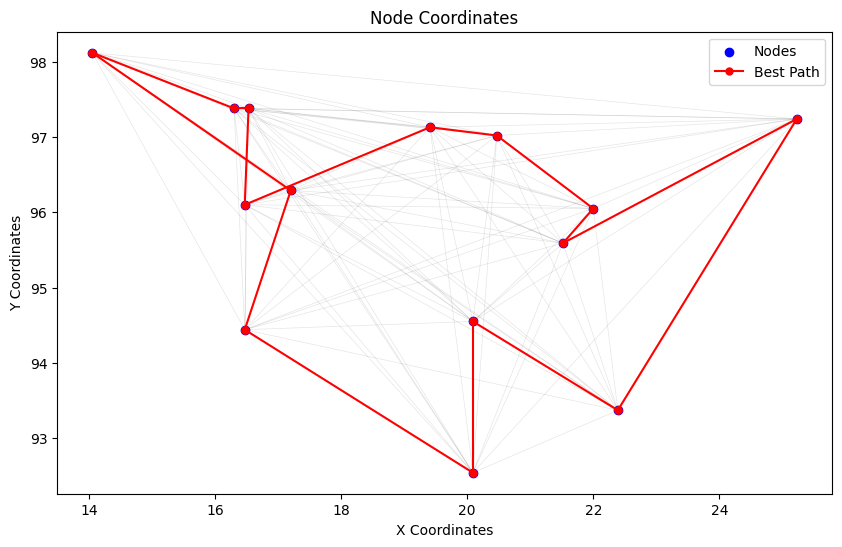

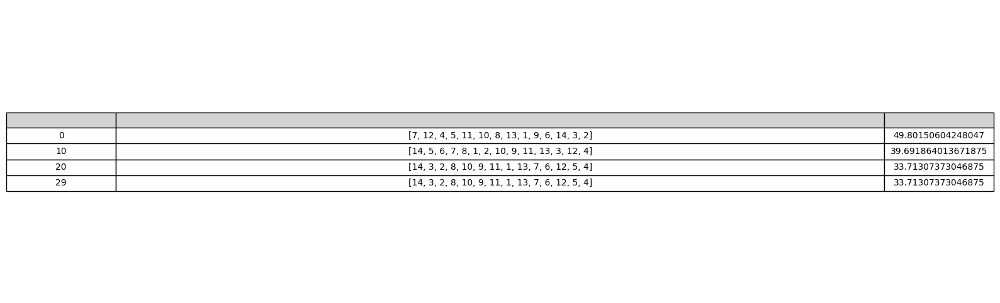

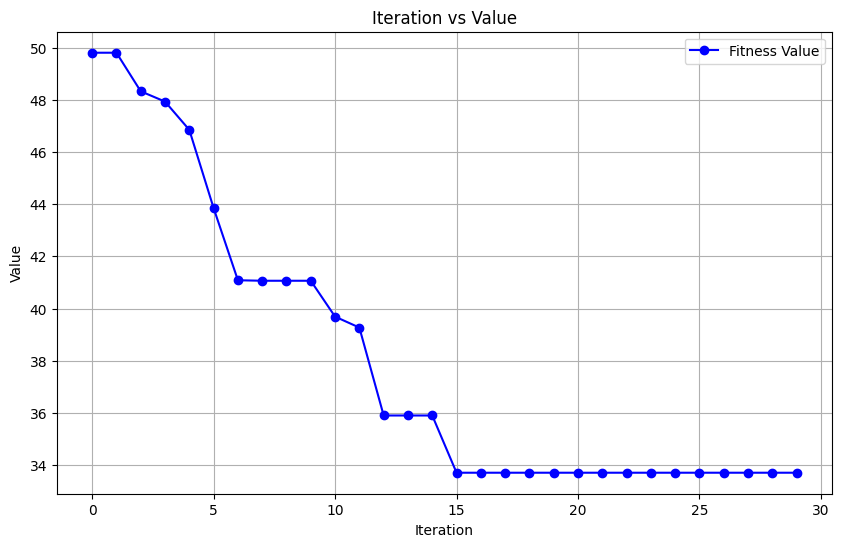

In [151]:
particleCount = 10
maxIterations = 30

psoV1 = ParticleSwarmOptimiserV1(
    nodeCount=burma14.dimension,
    nodeCoordinates = burma14.nodeCoordinates,
    distanceMatrix = burma14.distanceMatrix,
    particleCount=particleCount,
    swapCount = 3,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = False
)

psoV1.optimise(maxIterations)
bestPathV1, bestCostV1, historyV1, timeTakenV1 = psoV1.getBestSolution()

print("\nBest Path Found:", bestPathV1.tolist())
print("Best Cost:", bestCostV1)
print(f"time taken: {timeTakenV1}")
psoV1.visualise()
psoV1.showIterationHistory()
psoV1.showLossAgainstIterationGraph()

##### V2 <a name="V2-1"></a>

Then I ran V2 with the exact same parameters. V2 excels at finding the optimal solution, finding it within 20 iterations! It does not even need the full 30 iterations:


Best Path Found: [10, 1, 2, 14, 3, 4, 5, 6, 12, 7, 13, 8, 11, 9]
Best Cost: tensor(30.8785)
time taken: 5.288480520248413


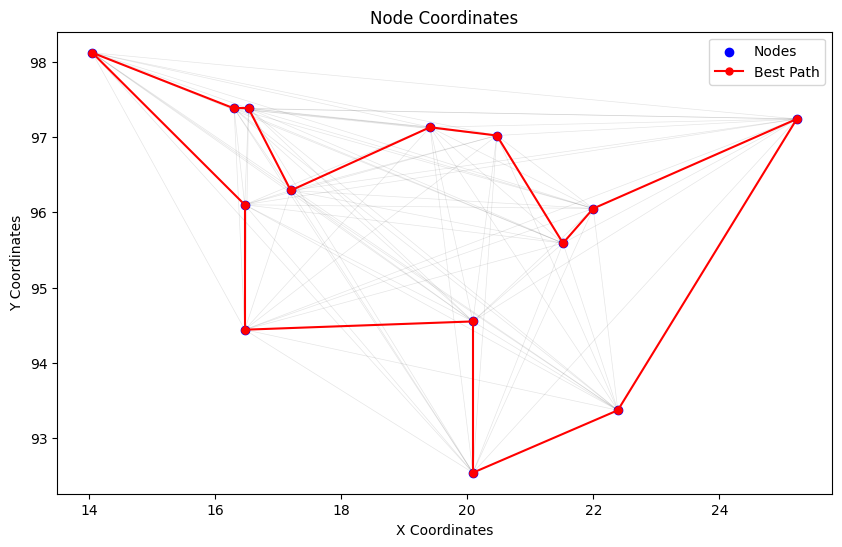

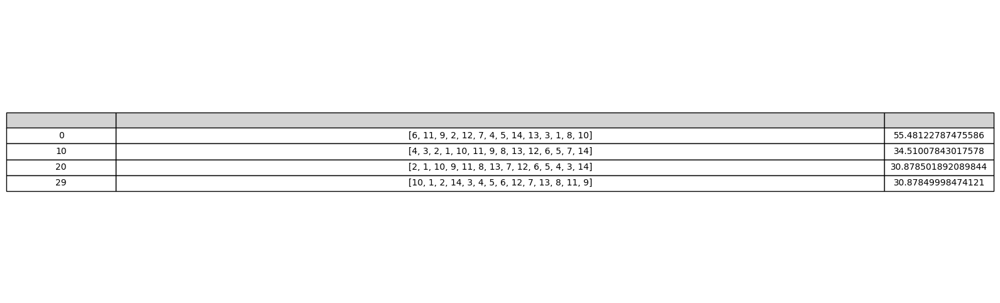

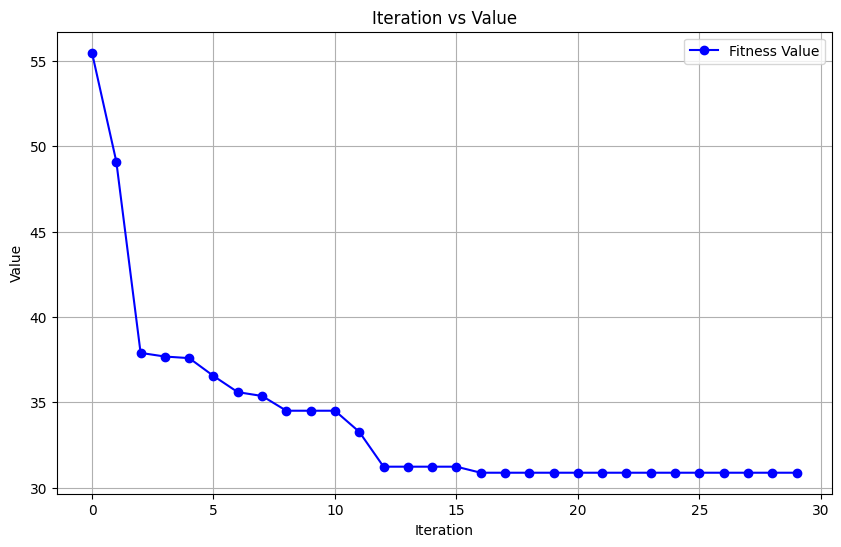

In [152]:
particle_count = 10
max_iterations = 30
alpha = 1
beta = 1
gamma = 1

psoV2 = ParticleSwarmOptimiserV2(
    nodeCount=burma14.dimension,
    nodeCoordinates = burma14.nodeCoordinates,
    distanceMatrix = burma14.distanceMatrix,
    particleCount=particle_count,
    swapCount = 3,
    alpha = alpha,
    beta = beta,
    gamma = gamma,
    greedyInitialisation = False
)

psoV2.optimise(max_iterations)
bestPathV2, bestCostV2, historyV2, timeTakenV2 = psoV2.getBestSolution()

print("\nBest Path Found:", bestPathV2.tolist())
print("Best Cost:", bestCostV2)
print(f"time taken: {timeTakenV2}")
psoV2.visualise()
psoV2.showIterationHistory()
psoV2.showLossAgainstIterationGraph()

##### Comparing Results <a name="Comparing-Results-1"></a>

If we compare the results, we can see that variant 2 performs better, reaching the optimal solution, but takes more time to do the full 30 iterations (3.8s vs 5.3s). V1 starts off strongly, but plateaus quickly, finding it more difficult to improve.

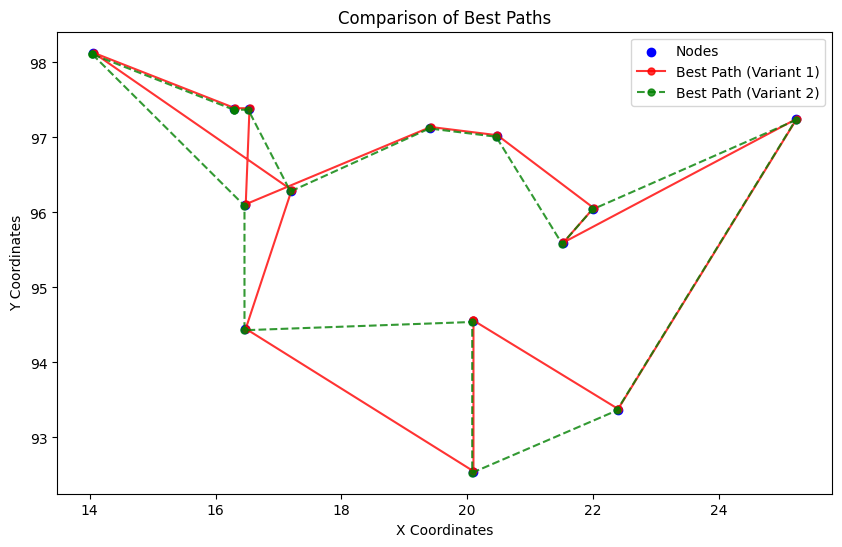

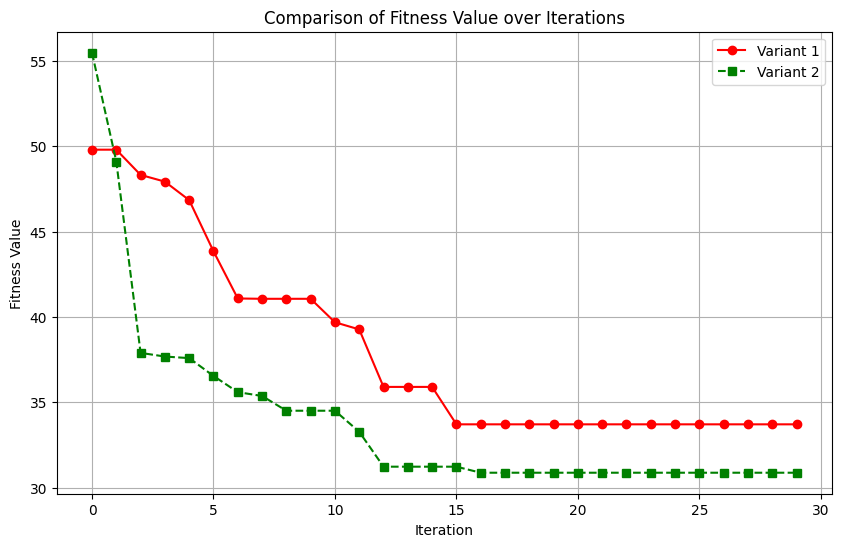

               Metric                  V1                 V2
0  Execution Time (s)  3.7995622158050537  5.288480520248413
1                Cost               33.71              30.88
2          Iterations                  30                 30
3           Particles                  10                 10
4    alpha|beta|gamma               1|1|1              1|1|1


In [153]:
compareBestRoutes(psoV1, psoV2)
compareLossCurves(psoV1, psoV2)
comparisonTable(psoV1, psoV2)

#### Comparison after tuning parameters <a name="Comparison-after-tuning-parameters-1"></a>

I then decided to tune the parameters of each to see how each variant's performance would be impacted. I aimed to tune V1's parameters such that it could find the optimal solution within a reasonable time, and I aimed to tune V2 so that it could find the optimal solution in the minimal iterations possible.

##### V1 <a name="V1-2"></a>

I first allowed greedy initialisation. I also increased the amount of iterations, the amount of particles, and the amount of swaps. Based on the past performance, it spends more time exploring before exploiting towards the end, so to enhance exploitation I increased the gamma value. The results show that it managed to reach the optimal solution within 50 iterations.


Best Path Found: [5, 4, 3, 14, 2, 1, 10, 9, 11, 8, 13, 7, 12, 6]
Best Cost: tensor(30.8785)
time taken: 38.12218451499939


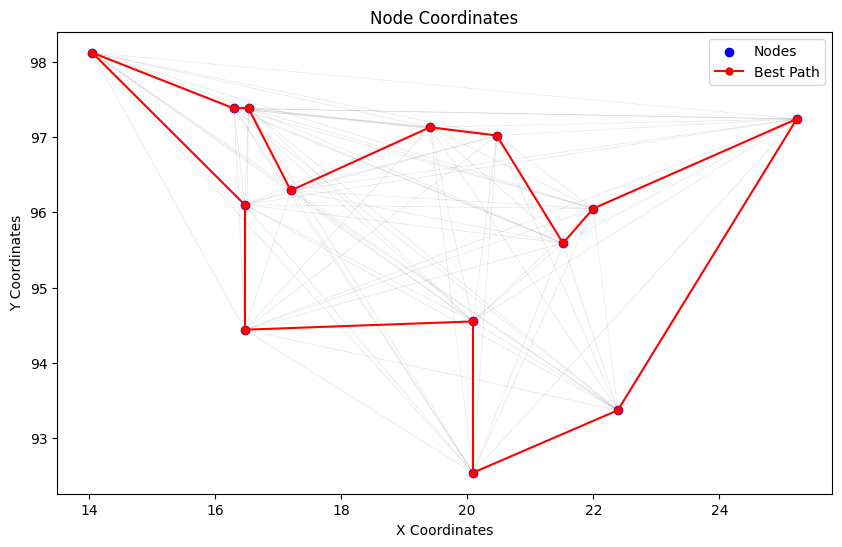

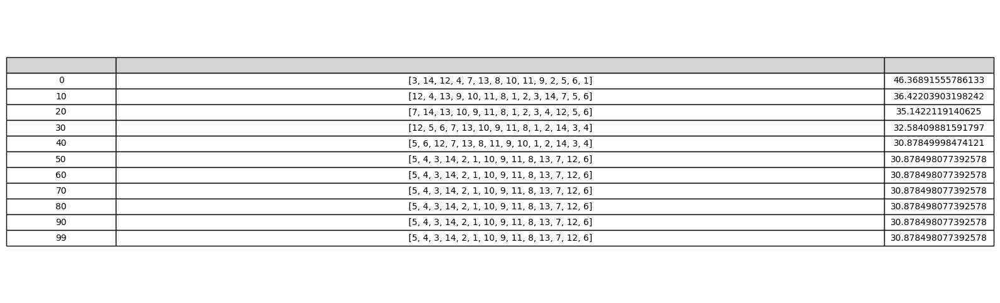

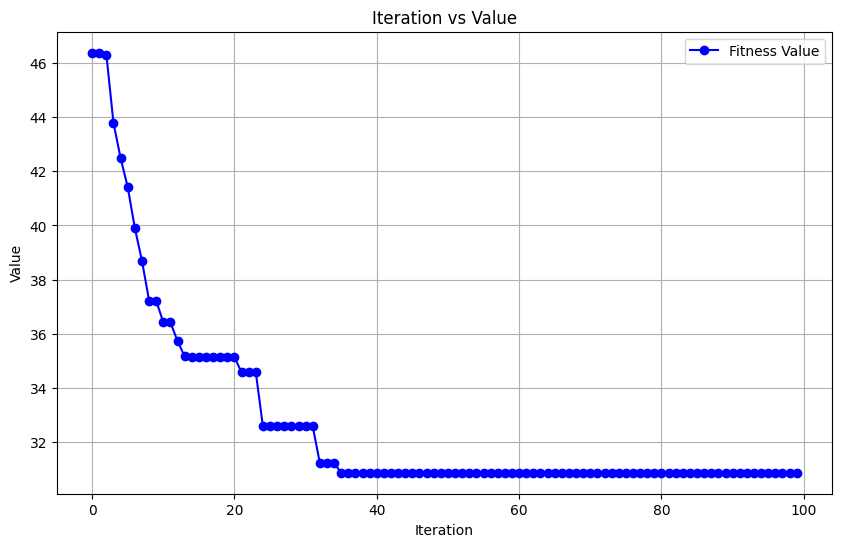

In [154]:
particleCount = 20
maxIterations = 100

psoV1 = ParticleSwarmOptimiserV1(
    nodeCount=burma14.dimension,
    nodeCoordinates = burma14.nodeCoordinates,
    distanceMatrix = burma14.distanceMatrix,
    particleCount=particleCount,
    swapCount = 3,
    alpha = 1,
    beta = 1,
    gamma = 2,
    greedyInitialisation = True
)

psoV1.optimise(maxIterations)
bestPathV1, bestCostV1, historyV1, timeTakenV1 = psoV1.getBestSolution()

print("\nBest Path Found:", bestPathV1.tolist())
print("Best Cost:", bestCostV1)
print(f"time taken: {timeTakenV1}")
psoV1.visualise()
psoV1.showIterationHistory()
psoV1.showLossAgainstIterationGraph()

##### V2 <a name="V2-2"></a>

In the initial run, this variant managed to achieve the optimal solution, so I was interested to see how it could be optimised further. I increased the gamma value to allow for more exploitation of the global best. Also I decreased the amount of iterations to 15 and increased the amount of swaps to 5, and was able to reach the optimal solution in less iterations than before. It was also significantly faster than before, nearly doubling in speed compared to the first attempt!


Best Path Found: [3, 14, 2, 1, 10, 9, 11, 8, 13, 7, 12, 6, 5, 4]
Best Cost: tensor(30.8785)
time taken: 4.515297174453735


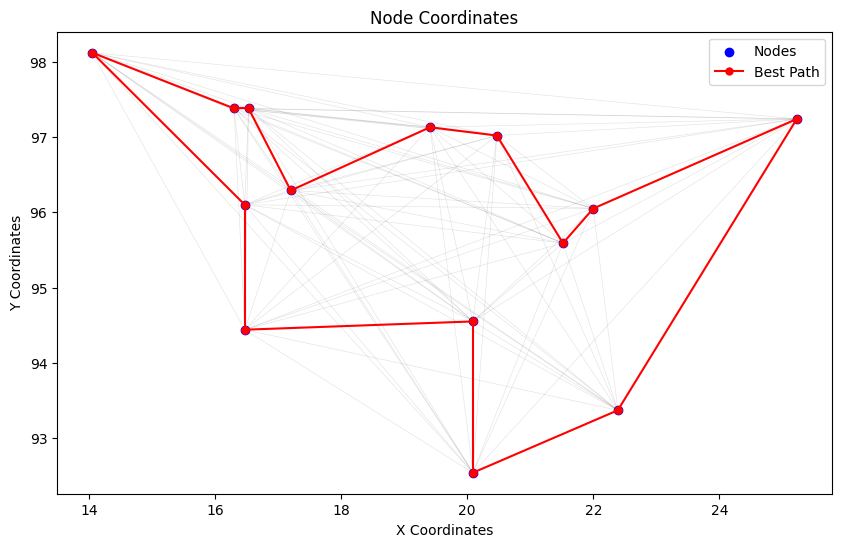

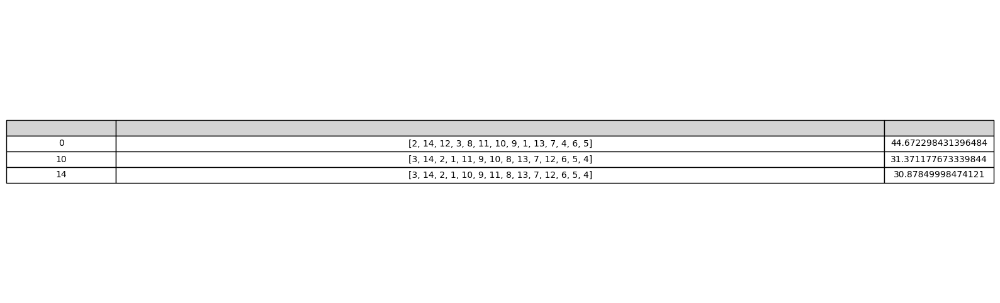

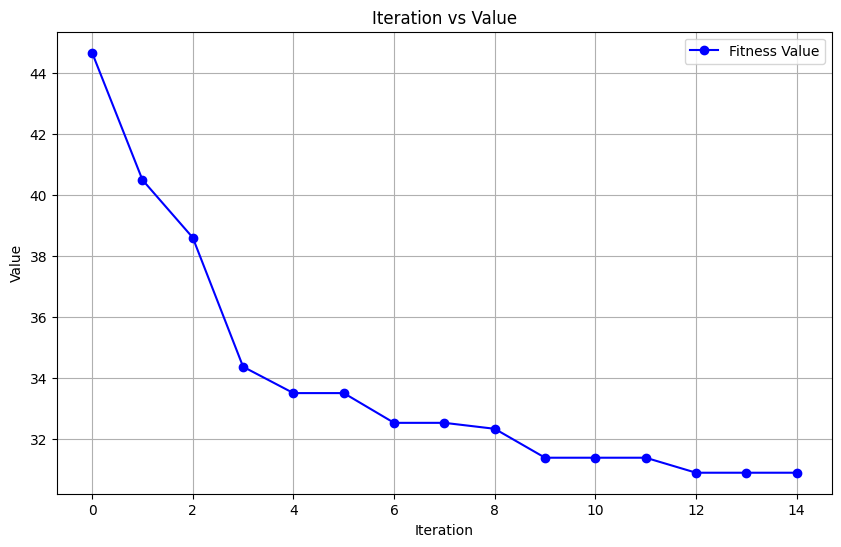

In [155]:
particle_count = 10
max_iterations = 15
alpha = 1
beta = 1
gamma = 2

psoV2 = ParticleSwarmOptimiserV2(
    nodeCount=burma14.dimension,
    nodeCoordinates = burma14.nodeCoordinates,
    distanceMatrix = burma14.distanceMatrix,
    particleCount=particle_count,
    swapCount = 5,
    alpha = alpha,
    beta = beta,
    gamma = gamma,
    greedyInitialisation = True
)

psoV2.optimise(max_iterations)
bestPathV2, bestCostV2, historyV2, timeTakenV2 = psoV2.getBestSolution()

print("\nBest Path Found:", bestPathV2.tolist())
print("Best Cost:", bestCostV2)
print(f"time taken: {timeTakenV2}")
psoV2.visualise()
psoV2.showIterationHistory()
psoV2.showLossAgainstIterationGraph()

##### Comparing Results <a name="Comparing-Results-2"></a>

Despite both algorithms reaching the optimal solution, it is evident that V2 is significantly better than V1 in all aspects. Even with increased iterations, particles, and swaps, V1 does not reach the optimal solution nearly as efficiently. V2 reaches the optimal solution faster, with less iterations and less computational resources used.

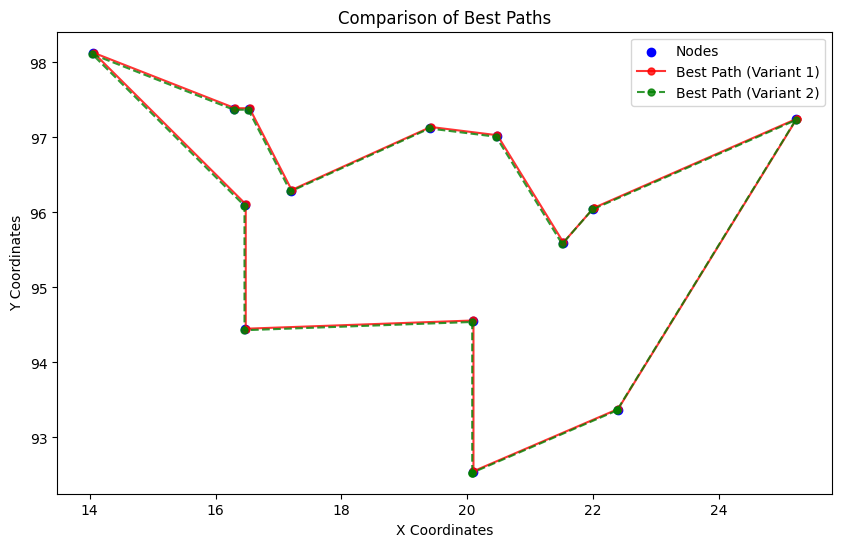

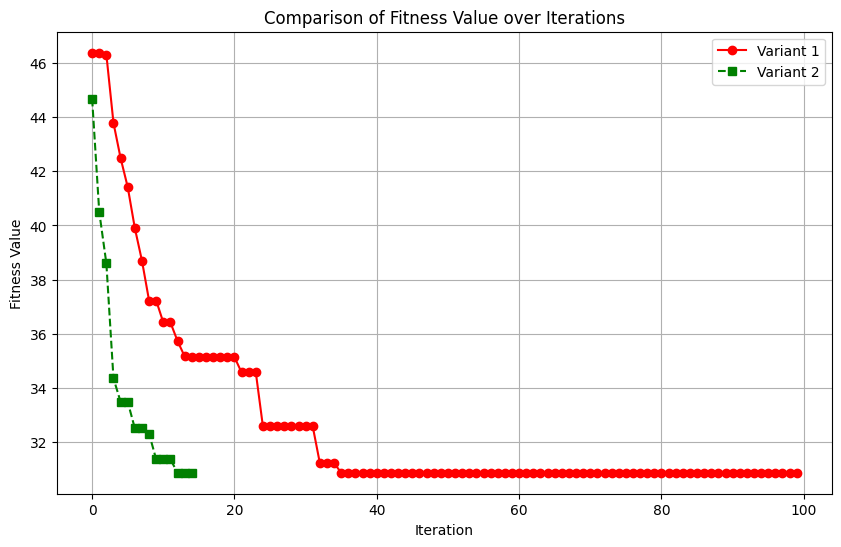

               Metric                 V1                 V2
0  Execution Time (s)  38.12218451499939  4.515297174453735
1                Cost              30.88              30.88
2          Iterations                100                 15
3           Particles                 20                 10
4    alpha|beta|gamma              1|1|2              1|1|2


In [156]:
compareBestRoutes(psoV1, psoV2)
compareLossCurves(psoV1, psoV2)
comparisonTable(psoV1, psoV2)

### att48 Analysis

The following section contains a similar analysis as above, except on the att48 problem instance. This is significantly more difficult since it contains 48 nodes, compared to only 14 previously, and there is a lot of variation in how close the nodes are.

#### Initial comparison <a name="Initial-Comparison-2"></a>

##### V1 <a name="V1-3"></a>

Due to the fact that this is a much larger problem, I decided to increase the amount of iterations and particles significantly. Other than that, I kept most of the other variables the same.


Best Path Found: [18, 36, 30, 37, 19, 27, 43, 17, 6, 28, 7, 1, 16, 8, 38, 9, 15, 12, 47, 11, 3, 40, 23, 25, 14, 20, 33, 46, 44, 31, 22, 41, 34, 32, 39, 24, 29, 2, 10, 4, 26, 45, 35, 42, 5, 48, 13, 21]
Best Cost: tensor(50945.7227)
time taken: 154.2441759109497


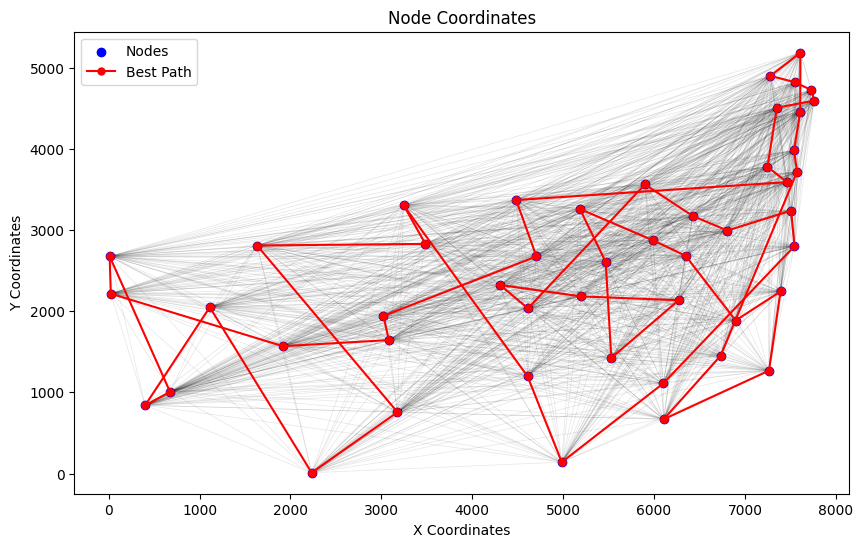

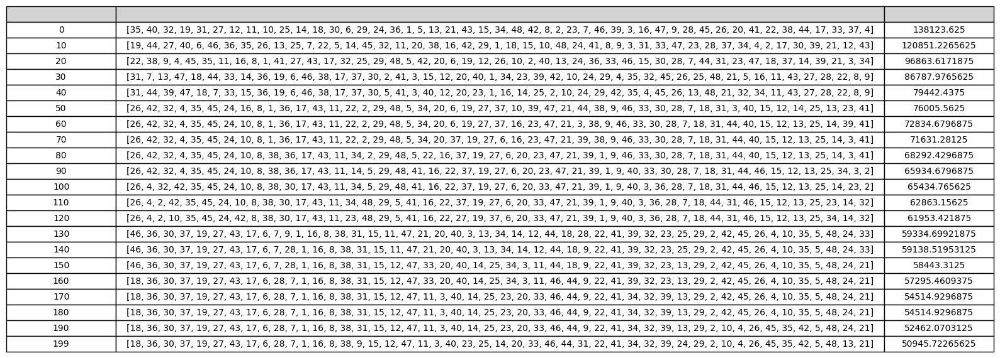

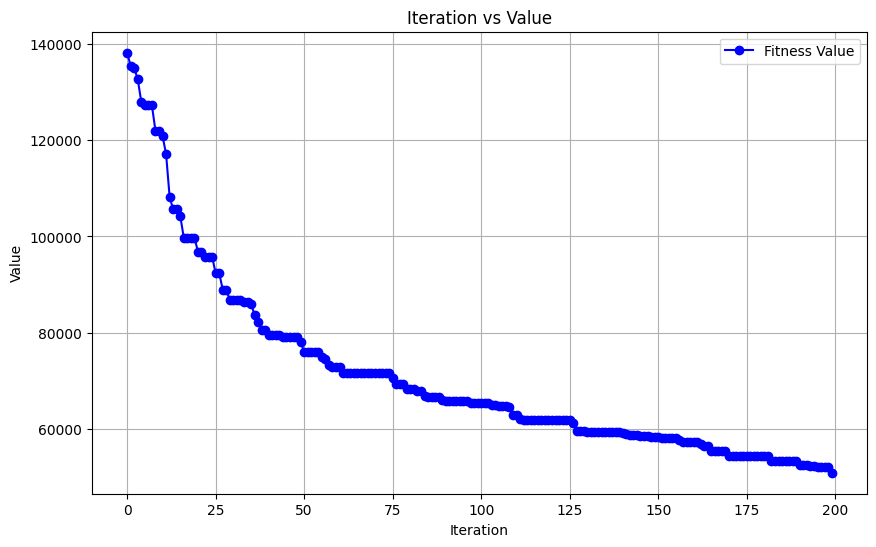

In [157]:
particleCount = 20
maxIterations = 200

psoV1 = ParticleSwarmOptimiserV1(
    nodeCount=att48.dimension,
    nodeCoordinates = att48.nodeCoordinates,
    distanceMatrix = att48.distanceMatrix,
    particleCount=particleCount,
    swapCount = 3,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = False
)

psoV1.optimise(maxIterations)
bestPathV1, bestCostV1, historyV1, timeTakenV1 = psoV1.getBestSolution()

print("\nBest Path Found:", bestPathV1.tolist())
print("Best Cost:", bestCostV1)
print(f"time taken: {timeTakenV1}")
psoV1.visualise()
psoV1.showIterationHistory()
psoV1.showLossAgainstIterationGraph()

##### V2 <a name="V2-3"></a>

I used the same parameters for V2 as I did for V1.


Best Path Found: [44, 36, 30, 43, 17, 27, 19, 37, 6, 28, 18, 7, 31, 38, 9, 1, 8, 22, 16, 3, 41, 34, 5, 42, 24, 10, 45, 35, 26, 4, 2, 29, 48, 32, 39, 25, 14, 23, 13, 21, 47, 20, 12, 11, 40, 15, 33, 46]
Best Cost: tensor(36366.8359)
time taken: 319.5780963897705


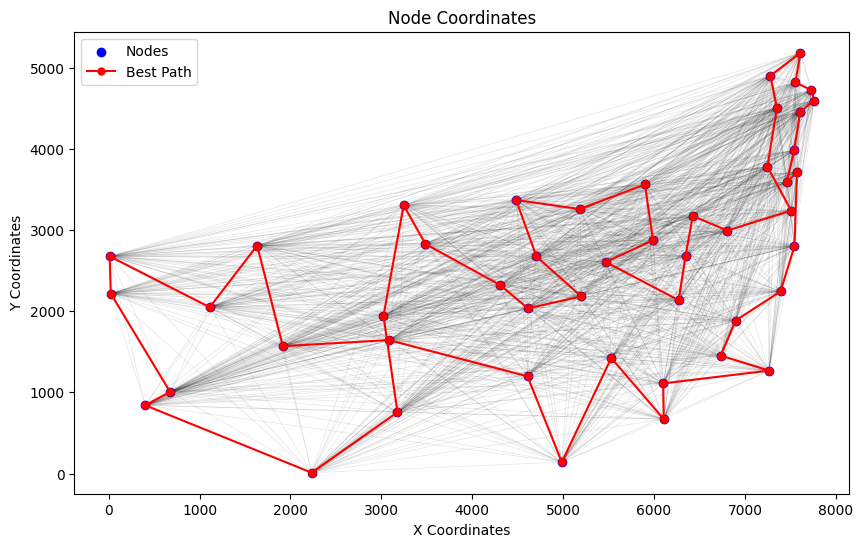

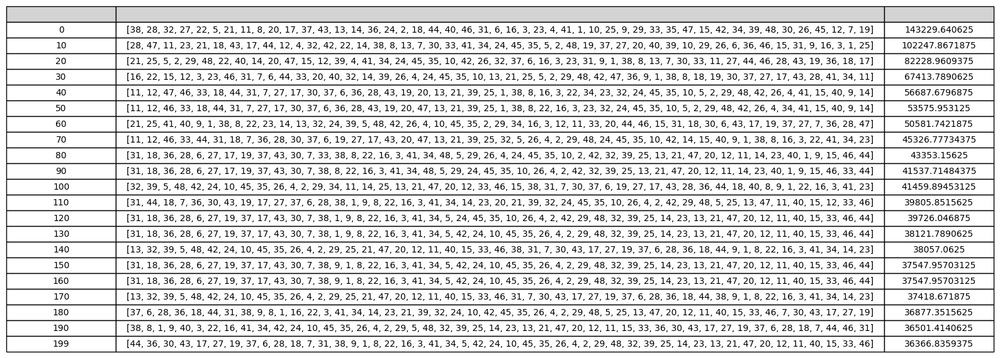

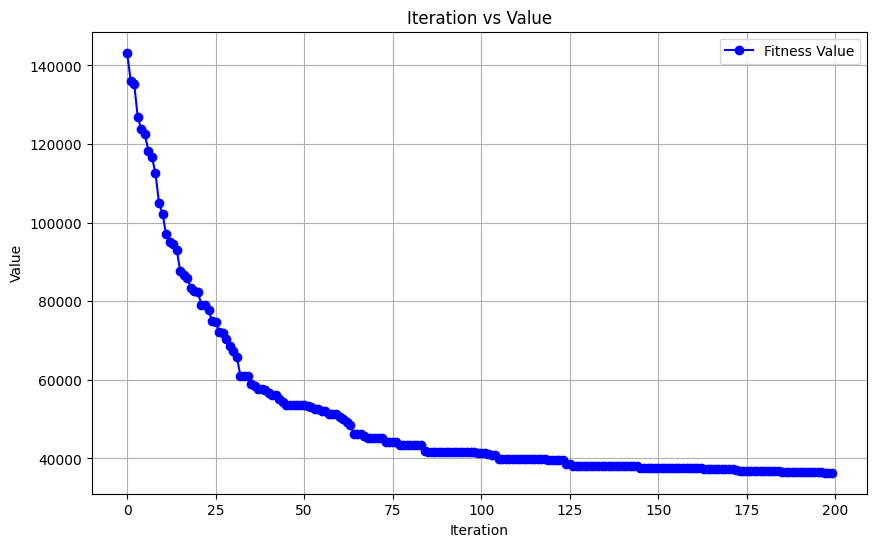

In [159]:
particleCount = 20
maxIterations = 200

psoV2 = ParticleSwarmOptimiserV2(
    nodeCount=att48.dimension,
    nodeCoordinates = att48.nodeCoordinates,
    distanceMatrix = att48.distanceMatrix,
    particleCount=particleCount,
    swapCount = 3,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = False
)

psoV2.optimise(maxIterations)
bestPathV2, bestCostV2, historyV2, timeTakenV2 = psoV2.getBestSolution()

print("\nBest Path Found:", bestPathV2.tolist())
print("Best Cost:", bestCostV2)
print(f"time taken: {timeTakenV2}")
psoV2.visualise()
psoV2.showIterationHistory()
psoV2.showLossAgainstIterationGraph()

##### Comparing Results <a name="Comparing-Results-3"></a>

Both algorithms reach decent approximations, but V2 clearly reaches a much better one, with a final cost of around 36000 compared to over 50000 for V1. However, V2 takes a significantly longer amount of time. With some tuning, both algorithms can be improved, which will be shown in the next section.

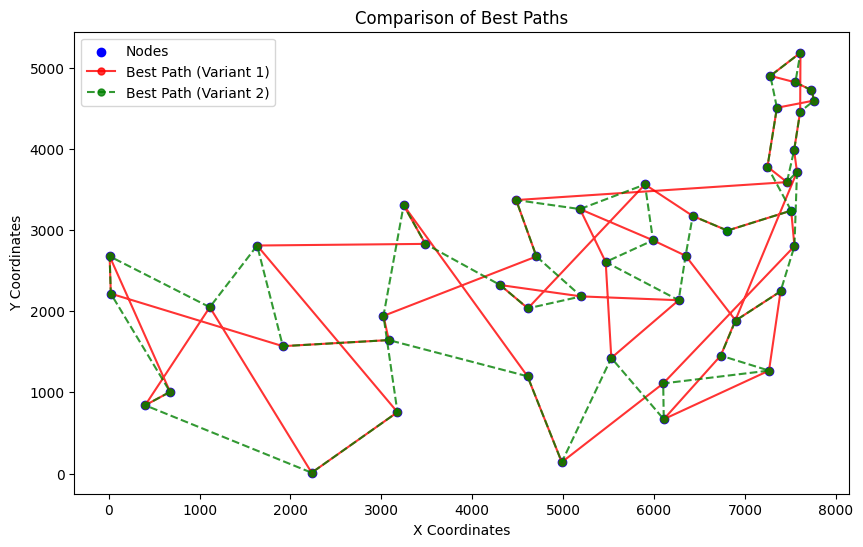

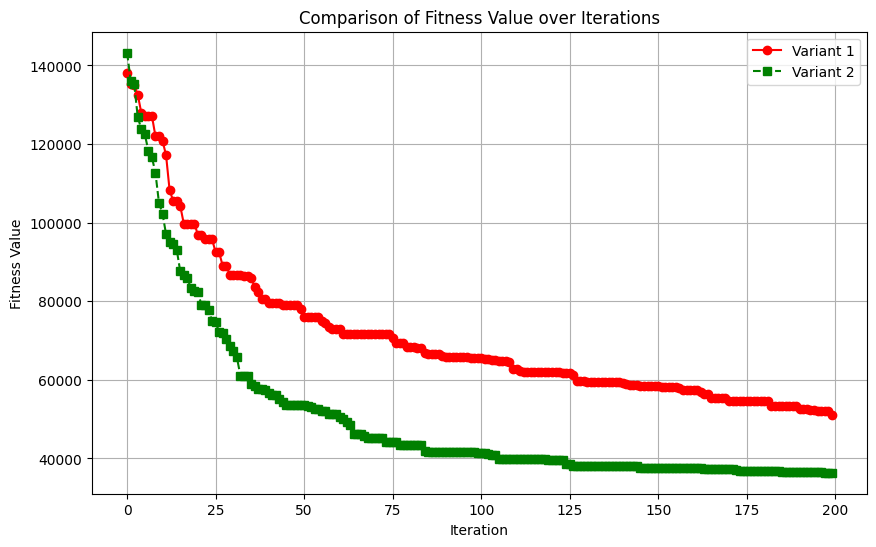

               Metric                 V1                 V2
0  Execution Time (s)  154.2441759109497  319.5780963897705
1                Cost           50945.72           36366.84
2          Iterations                200                200
3           Particles                 20                 20
4    alpha|beta|gamma              1|1|1              1|1|1


In [161]:
compareBestRoutes(psoV1, psoV2)
compareLossCurves(psoV1, psoV2)
comparisonTable(psoV1, psoV2)

#### Comparison after tuning parameters <a name="Comparison-after-tuning-parameters-3"></a>

##### V1 <a name="V1-4"></a>

First, I applied greedy initialisation. Then I increased the amount of randomness by increasing alpha, which should help prevent the algorithm falling into local minima, allowing for more exploration. I also increased the particles and iterations.

The resulting solution is very good, only requiring a few changes to be optimal. Also, according to the loss vs iteration graph, the changes to alpha, beta, and gamma seem to have a strong impact. There clearly seems to be more exploration at the start and more exploitation towards the end.


Best Path Found: [9, 15, 33, 46, 44, 7, 18, 28, 37, 19, 27, 17, 43, 30, 6, 36, 31, 38, 8, 1, 22, 16, 41, 3, 23, 11, 12, 20, 47, 21, 25, 39, 32, 24, 48, 5, 29, 42, 10, 45, 35, 4, 26, 2, 34, 14, 13, 40]
Best Cost: tensor(39248.7773)
time taken: 1418.777484178543


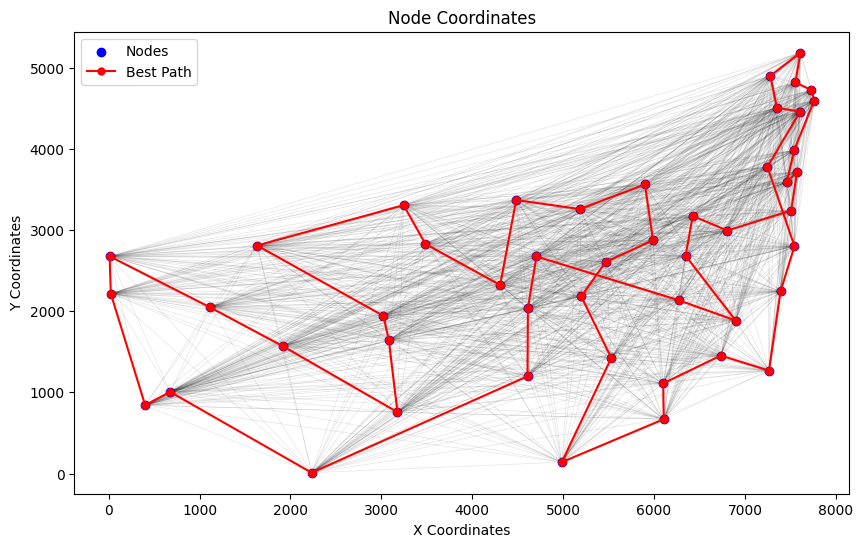

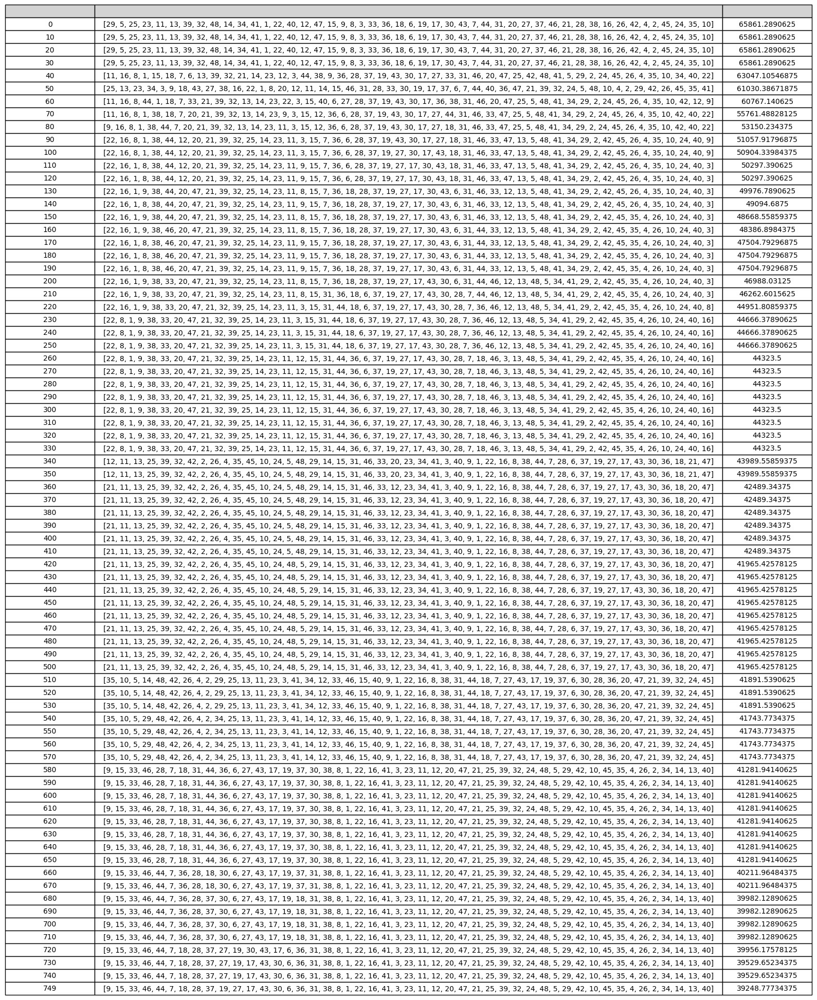

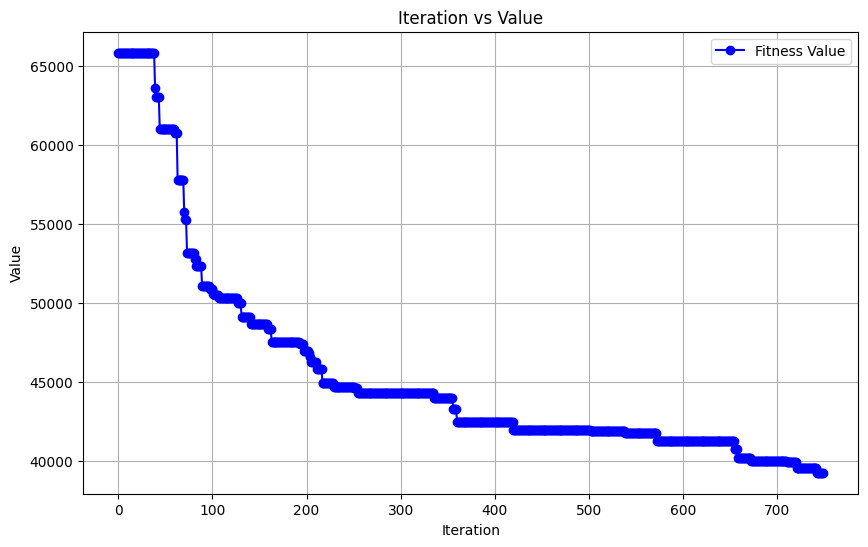

In [174]:
particleCount = 50
maxIterations = 750

psoV1 = ParticleSwarmOptimiserV1(
    nodeCount=att48.dimension,
    nodeCoordinates = att48.nodeCoordinates,
    distanceMatrix = att48.distanceMatrix,
    particleCount=particleCount,
    swapCount = 5,
    alpha = 2,
    beta = 1,
    gamma = 2,
    greedyInitialisation = True
)

psoV1.optimise(maxIterations)
bestPathV1, bestCostV1, historyV1, timeTakenV1 = psoV1.getBestSolution()

print("\nBest Path Found:", bestPathV1.tolist())
print("Best Cost:", bestCostV1)
print(f"time taken: {timeTakenV1}")
psoV1.visualise()
psoV1.showIterationHistory()
psoV1.showLossAgainstIterationGraph()

##### V2 <a name="V2-4"></a>

I also increased the iterations and particles to a similar amount as V1. I felt that the balance of exploration vs exploitation was ideal, so I did not change the alpha, beta, and gamma values. However, I did increase the amount of segment reinsertions happening at each stage.

The solution it results in is even better, only requiring 1 more change to be optimal.


Best Path Found: [39, 32, 48, 5, 42, 24, 10, 45, 35, 4, 26, 2, 29, 41, 16, 22, 3, 34, 14, 23, 11, 12, 33, 46, 36, 30, 43, 17, 27, 19, 37, 6, 28, 7, 18, 44, 31, 38, 8, 1, 9, 40, 15, 20, 47, 21, 13, 25]
Best Cost: tensor(34384.9648)
time taken: 3301.3370122909546


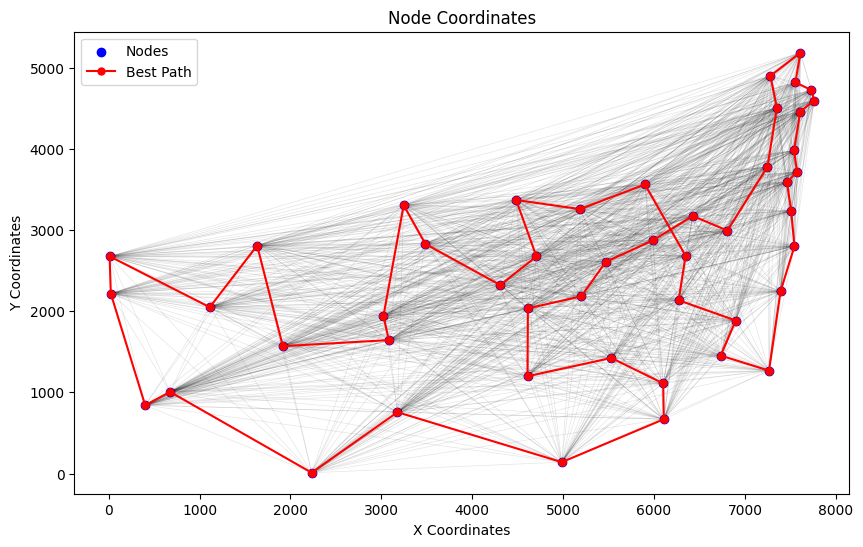

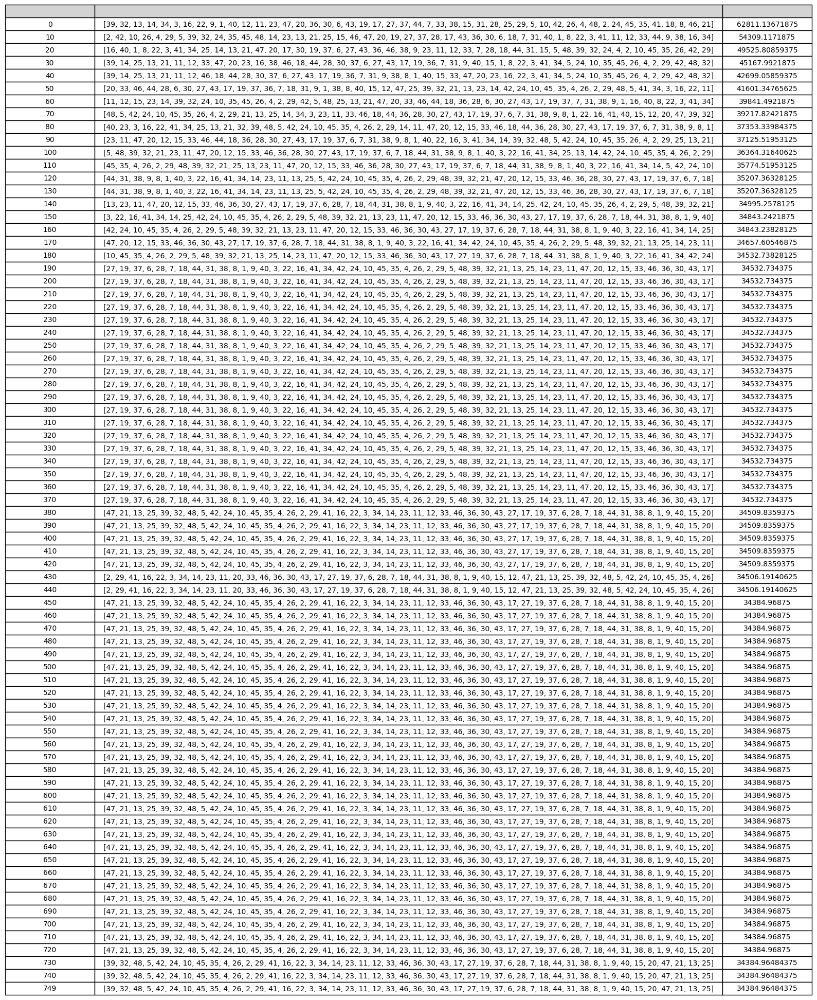

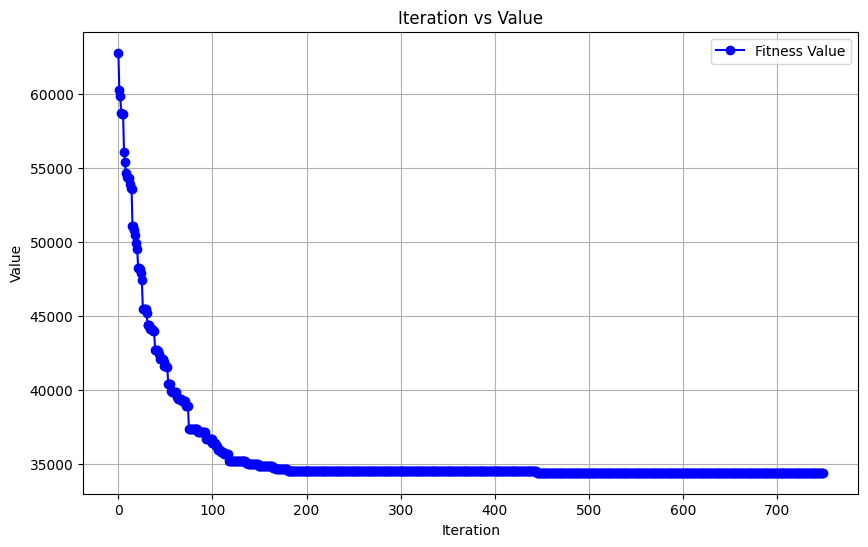

In [175]:
particleCount = 50
maxIterations = 750

psoV2 = ParticleSwarmOptimiserV2(
    nodeCount=att48.dimension,
    nodeCoordinates = att48.nodeCoordinates,
    distanceMatrix = att48.distanceMatrix,
    particleCount=particleCount,
    swapCount = 4,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = True
)

psoV2.optimise(maxIterations)
bestPathV2, bestCostV2, historyV2, timeTakenV2 = psoV2.getBestSolution()

print("\nBest Path Found:", bestPathV2.tolist())
print("Best Cost:", bestCostV2)
print(f"time taken: {timeTakenV2}")
psoV2.visualise()
psoV2.showIterationHistory()
psoV2.showLossAgainstIterationGraph()

##### Comparing Results <a name="Comparing-Results-4"></a>

Both algorithms come to good quality, yet different solutions. V2 comes to a better solution after the same amount of iterations, but V1 is over twice as fast, taking 1418s in V1 compared to 3301s for V2.

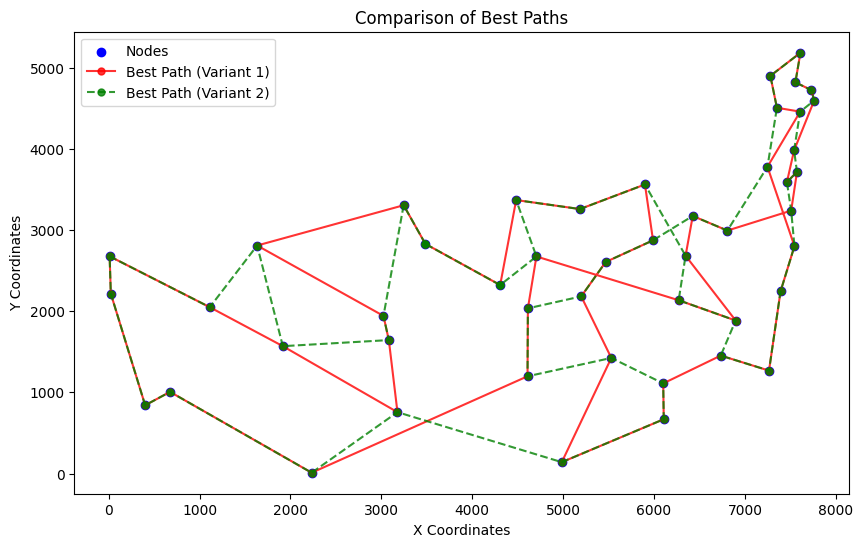

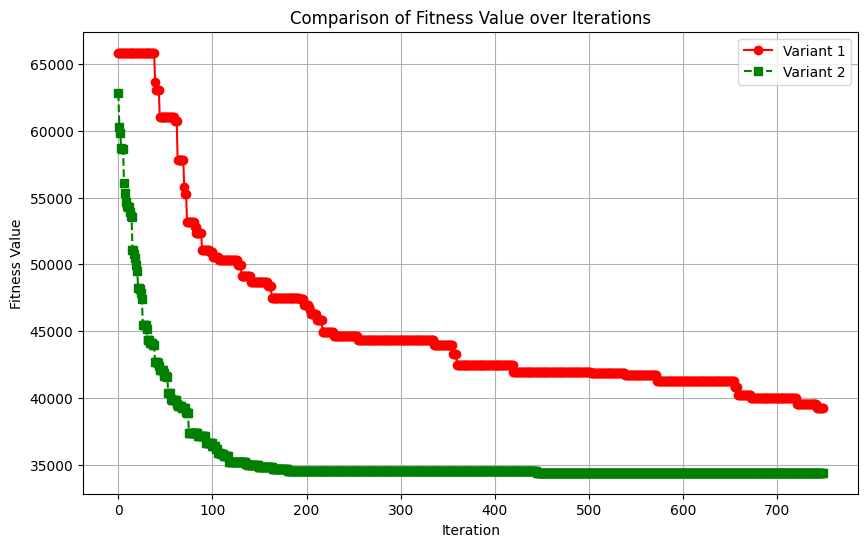

               Metric                 V1                  V2
0  Execution Time (s)  1418.777484178543  3301.3370122909546
1                Cost           39248.78            34384.96
2          Iterations                750                 750
3           Particles                 50                  50
4    alpha|beta|gamma              2|1|2               1|1|1


In [177]:
compareBestRoutes(psoV1, psoV2)
compareLossCurves(psoV1, psoV2)
comparisonTable(psoV1, psoV2)

### lin105 Analysis

For lin105, I decided not to compare the runs before and after parameter tuning, because this would make the report tedious. Instead, I decided to try and get the best results I could with each variant.

lin105 was included more for comparative analysis, to see how scalable both algorithms were. This problem is not solvable within reasonable time constraints. However, during external testing, using V2 I did manage to find the optimal solution after tweaking some parameters, and using 2500 iterations and 100 particles. This took nearly 10 hours, but was successful.

#### Comparison

##### V1


Best Path Found: [72, 67, 71, 68, 82, 78, 83, 85, 92, 91, 96, 97, 101, 102, 98, 89, 90, 100, 95, 99, 93, 86, 74, 69, 73, 84, 79, 64, 62, 105, 59, 56, 49, 40, 45, 104, 52, 53, 57, 55, 50, 48, 54, 51, 47, 44, 46, 43, 37, 42, 39, 60, 38, 34, 35, 4, 5, 14, 13, 17, 18, 25, 16, 28, 33, 32, 31, 30, 29, 21, 22, 10, 15, 103, 20, 23, 19, 11, 7, 12, 9, 8, 3, 1, 2, 6, 24, 27, 26, 36, 41, 58, 65, 61, 63, 76, 80, 70, 66, 87, 88, 94, 75, 81, 77]
Best Cost: tensor(24239.2832)
time taken: 1482.7243399620056


c:\Users\A\VSCodeRepos\Solving-TSP-using-particle-swarm-optimisation\.venv\Lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


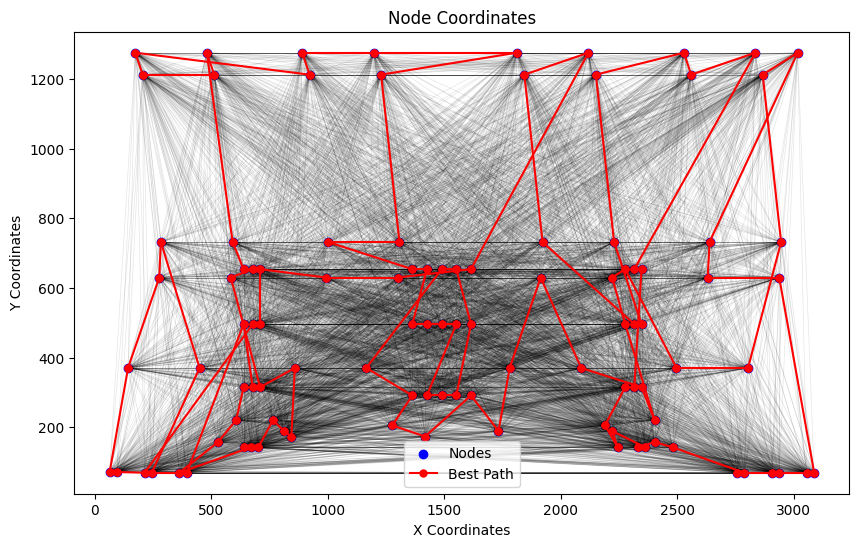

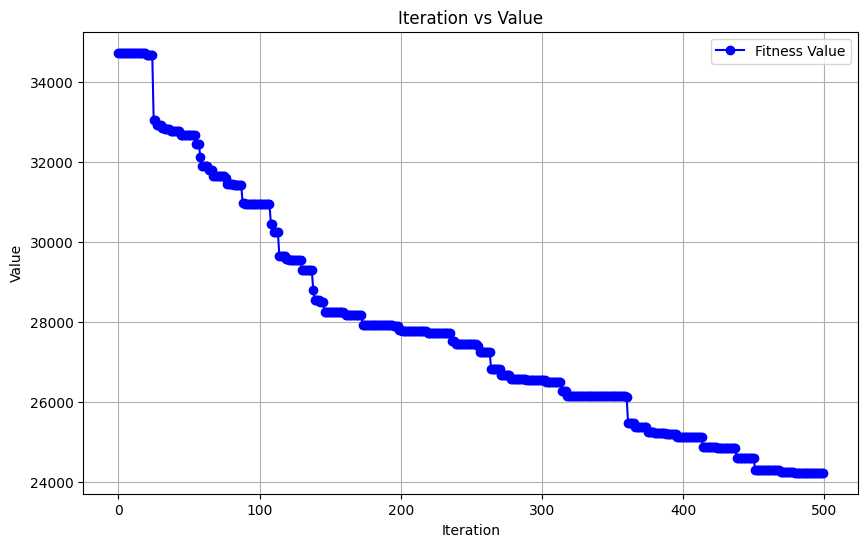

In [171]:
particleCount = 50
maxIterations = 500

psoV1 = ParticleSwarmOptimiserV1(
    nodeCount=lin105.dimension,
    nodeCoordinates = lin105.nodeCoordinates,
    distanceMatrix = lin105.distanceMatrix,
    particleCount=particleCount,
    swapCount = 3,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = True
)

psoV1.optimise(maxIterations)
bestPathV1, bestCostV1, historyV1, timeTakenV1 = psoV1.getBestSolution()

print("\nBest Path Found:", bestPathV1.tolist())
print("Best Cost:", bestCostV1)
print(f"time taken: {timeTakenV1}")
psoV1.visualise()
psoV1.showLossAgainstIterationGraph()

##### V2


Best Path Found: [13, 14, 5, 4, 8, 9, 16, 17, 26, 25, 18, 24, 19, 28, 103, 23, 20, 29, 22, 31, 32, 30, 21, 15, 10, 11, 6, 1, 2, 7, 3, 12, 27, 33, 104, 40, 49, 45, 41, 42, 37, 36, 43, 46, 52, 53, 58, 54, 57, 51, 47, 44, 48, 50, 55, 56, 59, 105, 77, 67, 82, 83, 85, 84, 68, 71, 78, 79, 72, 64, 63, 62, 70, 75, 80, 76, 73, 81, 74, 69, 90, 89, 86, 97, 102, 101, 96, 92, 91, 93, 98, 99, 100, 95, 94, 87, 88, 66, 65, 61, 60, 39, 38, 35, 34]
Best Cost: tensor(17934.6973)
time taken: 3103.121050596237


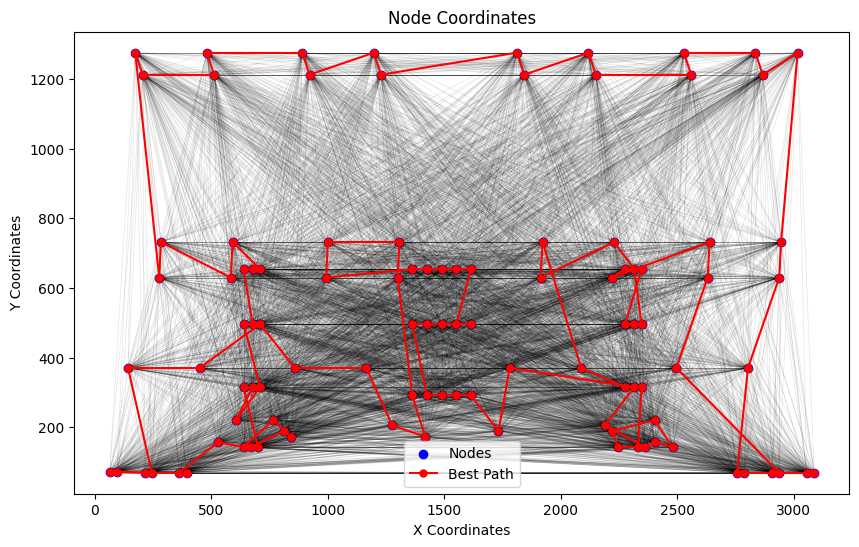

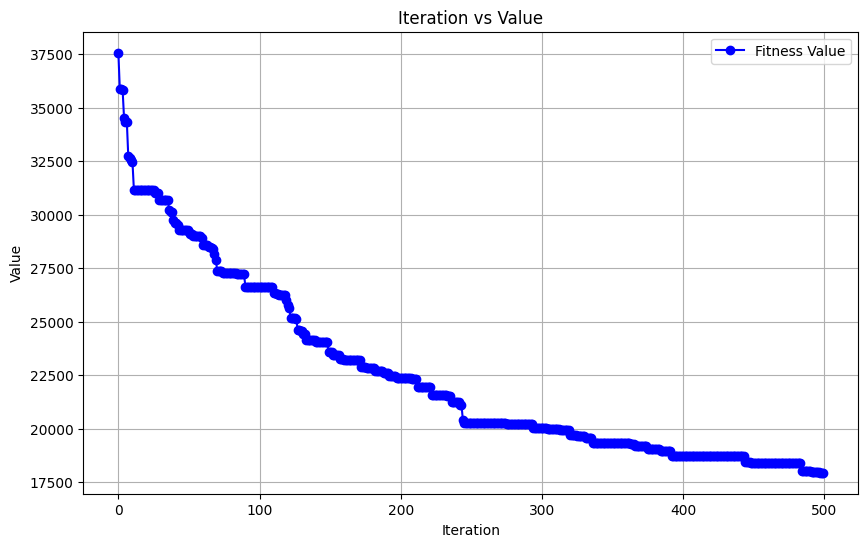

In [172]:
particleCount = 50
maxIterations = 500

psoV2 = ParticleSwarmOptimiserV2(
    nodeCount=lin105.dimension,
    nodeCoordinates = lin105.nodeCoordinates,
    distanceMatrix = lin105.distanceMatrix,
    particleCount=particleCount,
    swapCount = 3,
    alpha = 1,
    beta = 1,
    gamma = 1,
    greedyInitialisation = True
)

psoV2.optimise(maxIterations)
bestPathV2, bestCostV2, historyV2, timeTakenV2 = psoV2.getBestSolution()

print("\nBest Path Found:", bestPathV2.tolist())
print("Best Cost:", bestCostV2)
print(f"time taken: {timeTakenV2}")
psoV2.visualise()
psoV2.showLossAgainstIterationGraph()

##### Comparison Results

Again, V2 comes to a better solution, but takes significantly more time. V2 achieves a final cost of around 17000, which is a substantial improvement over V1's 24000, but takes more than double the time. Given more time, I believe that with several thousand iterations the optimal solution could be reached.

Something interesting to note is that the time taken to run 500 iterations on lin105 was approximately the same as running 750 iterations on att48. This indicates that both algorithms are very scalable, considering that lin105 has more than double the amount of nodes as att48.

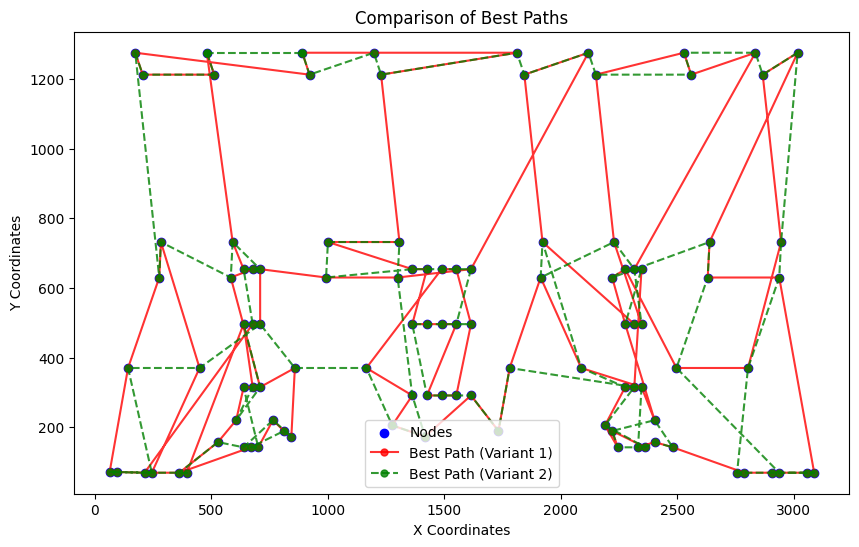

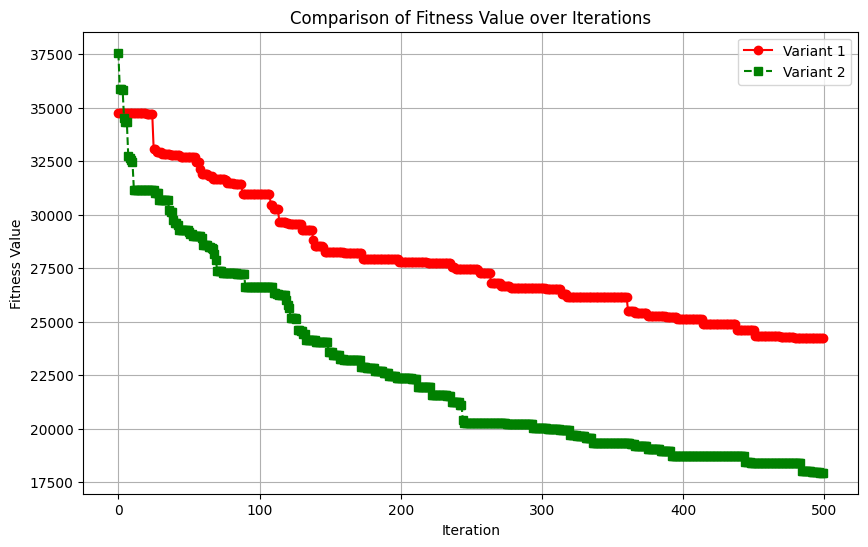

               Metric                  V1                 V2
0  Execution Time (s)  1482.7243399620056  3103.121050596237
1                Cost            24239.28           17934.70
2          Iterations                 500                500
3           Particles                  50                 50
4    alpha|beta|gamma               1|1|1              1|1|1


In [173]:
compareBestRoutes(psoV1, psoV2)
compareLossCurves(psoV1, psoV2)
comparisonTable(psoV1, psoV2)

## Comparison with Other Approaches

Both variants were based on approaches taken in 2 different papers. I will compare how the papers differ to each of my approaches here.

For approach 1, I updated each particle's velocity to be a sequence of swap operations, just like in [1]. The paper also mentions an alpha and beta parameters to control local and global influence, but I changed this slightly by adding a gamma variable. This means that there is an extra variable to control randomness. Also, in  [1] they take the approach of varying the size of the velocity by combining velocities of the local and global best. I found this to be very computationally intensive, so instead opted for changing the swap operations within the velocity, and keeping the overall velocity length the same. Overall, the changes I made were intended to try and guide updates more intelligently.

For approach 2, I was inspired by [2], which utilises genetic approaches. The paper mentions a k-opt approach, which is like a genetic crossover mutation. In my approach, I simplified this to take segments of the local and global best and insert them randomly to create new, better routes. This allows beneficial parts of good solutions to be directly transferred, and allows for better diversity.

### A brief comparison of burma14

In [1], burma14 is showcased as an example problem. They reach the optimal solution using 100 particles and 20000 iterations. However, my implementation reaches the optimal solution with only 15 particles and 50 iterations, only taking approximately 30 seconds. This is a significant improvement.

Their solution:
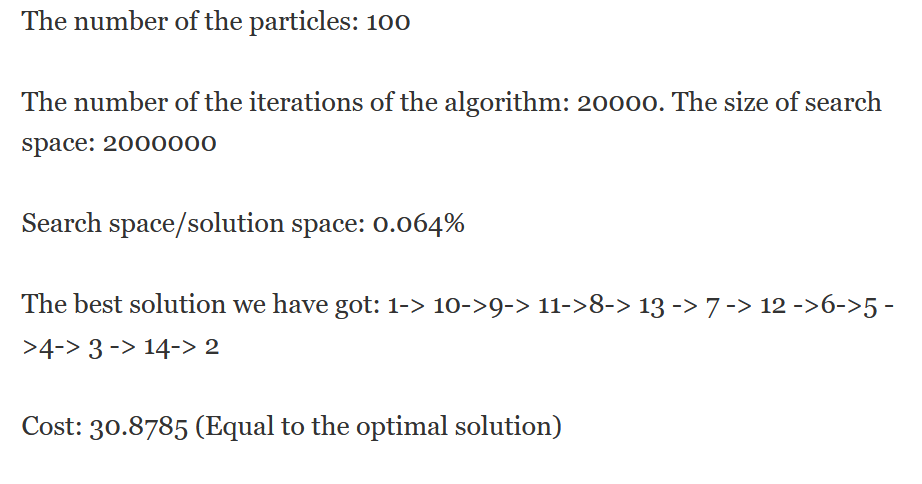[1]

### A brief comparison of bays29

[2] showcases their solution of the bays29 problem instance. As you can see from their graph compared to mine, my code reaches an optimal solution in half the amount of iterations than theirs. This indicates that segment reinsertion could be more effective than the k-opt mutation that they implement:

My solution using V2:


Best Path Found: [20, 2, 21, 5, 29, 3, 26, 9, 12, 6, 28, 1, 24, 13, 16, 27, 8, 23, 7, 25, 19, 11, 22, 17, 14, 18, 15, 4, 10]
Best Cost: tensor(9074.1465)
time taken: 116.68323373794556


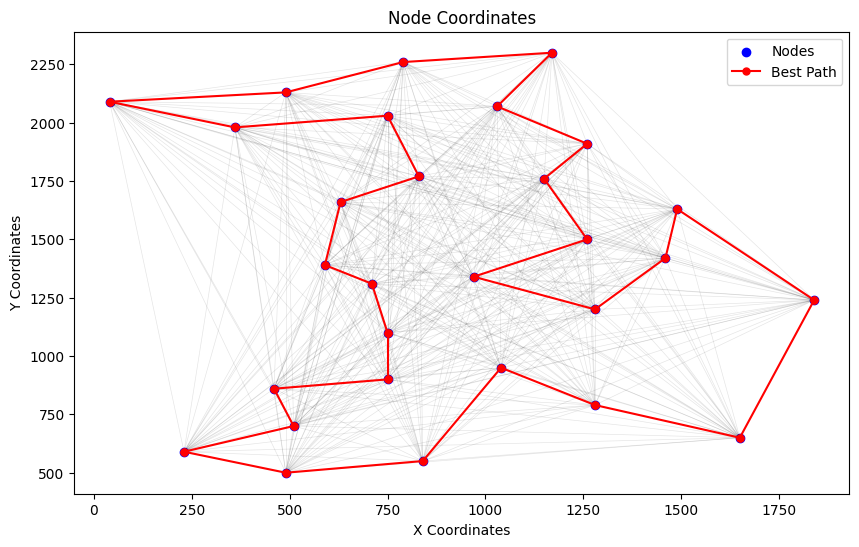

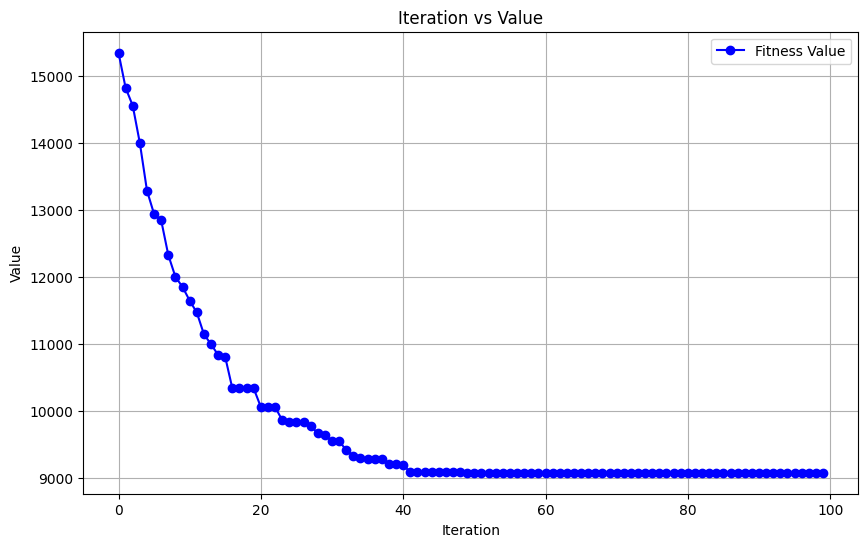

In [168]:
response = requests.get("https://raw.githubusercontent.com/mastqe/tsplib/refs/heads/master/bays29.tsp")
bays29 = TspParser(response.text)
particleCount = 20
maxIterations = 100

psoBaye29 = ParticleSwarmOptimiserV2(
    nodeCount=bays29.dimension,
    nodeCoordinates = bays29.nodeCoordinates,
    distanceMatrix = bays29.distanceMatrix,
    particleCount=particleCount,
    swapCount = 5,
    alpha = 1,
    beta = 1,
    gamma = 2,
    greedyInitialisation = True
)
psoBaye29.optimise(maxIterations)
bestPathV2, bestCostV2, historyV2, timeTakenV2 = psoBaye29.getBestSolution()

print("\nBest Path Found:", bestPathV2.tolist())
print("Best Cost:", bestCostV2)
print(f"time taken: {timeTakenV2}")
psoBaye29.visualise()
psoBaye29.showLossAgainstIterationGraph()

Their results with bays29. They reach an optimal solution at about 90 iterations, compared to 50 for my implementation:

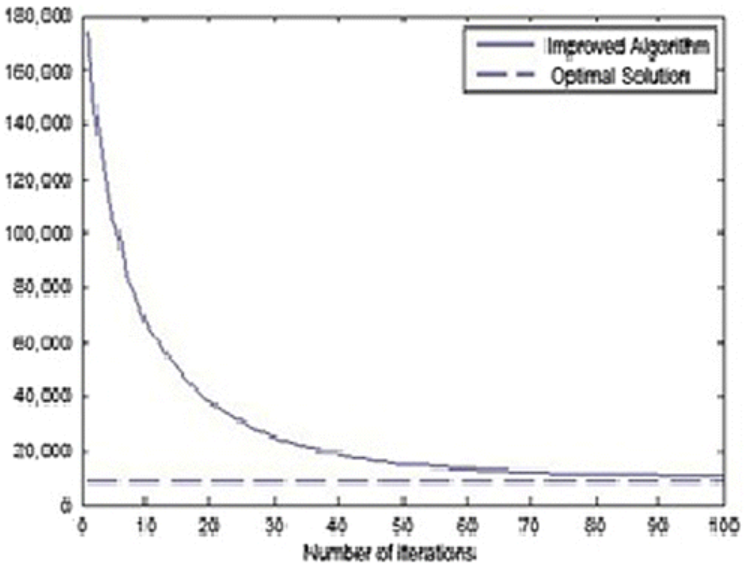

## Conclusion and future work

In this report I was able to explore 2 different approaches to the PSO algorithm in solving instances of the Travelling Salesman Problem. I was able to investigate whether velocity based swap sequences or segment reinsertion would be more effective. I also implemented parameters to modify the weight given to local vs global vs random influence, which allows fine tuned balancing between exploration and exploitation.

Overall, both approaches work well on standard sets of problem instances. However, for larger instances, V1 does not easily reach a good solution, whereas V2, using the segment reinsertion, is able to find optimal solutions in a reasonably amount of time. Also, V2 is shown to be at least as effective (on certain instances) as its parent approach in the paper given. However, V1 is much more resource efficient and faster.

Future work could involve extending these algorithms to much larger problem sizes, such as those with thousands of nodes, which would provide insights into real world applicability. Also, it could be interesting to see how other heuristic approaches such as simulated annealing and ant colony optimisation could be compared or integrated with PSO.

## References

[1] Kang-Ping Wang. *Particle Swarm Optimization for Travelling Salesman Problem*. https://ieeexplore.ieee.org/document/1259748  
[2] Kievan Borna. *A combination of genetic algorithm and particle swarm optimization method for solving traveling salesman problem*. https://www.tandfonline.com/doi/full/10.1080/23311835.2015.1048581  
[3] Mastqe. *TSPLIB: A Repository of Symmetric TSP Data*. GitHub Repository. https://github.com/mastqe/tsplib  
[4] Marcos Castro. *tsp_pso*. GitHub Repository. https://github.com/marcoscastro/tsp_pso/blob/master/references/paper.pdf
